<a href="https://colab.research.google.com/github/Sneha-dasgupta/Multi-class-seg/blob/main/Cup_Disk_Seg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Preparation

In [1]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
from glob import glob
from tqdm import tqdm
!pip install -U albumentations
from albumentations import HorizontalFlip, VerticalFlip, ElasticTransform, GridDistortion, OpticalDistortion

def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)

def load_data(path):
    """ X = Images and Y = masks """

    train_x = sorted(glob(os.path.join(path, "Training", "Images", "*.png")))
    train_y1 = sorted(glob(os.path.join(path, "Training", "GT_OD", "*.png")))
    train_y2 = sorted(glob(os.path.join(path, "Training", "GT_OC", "*.png")))


    test_x = sorted(glob(os.path.join(path, "Test", "Images", "*.png")))
    test_y1 = sorted(glob(os.path.join(path, "Test", "Test_GT_OD", "*.png")))
    test_y2 = sorted(glob(os.path.join(path, "Test", "Test_GT_OC", "*.png")))

    return (train_x, train_y1, train_y2), (test_x, test_y1, test_y2)

def augment_data(images, mask1, mask2, save_path, augment=True):
    H = 512
    W = 512

    for idx, (x, y, z) in tqdm(enumerate(zip(images, mask1, mask2)), total=len(images)):
        """ Extracting names """
        name = x.split("/")[-1].split(".")[0]

        """ Reading image and mask """
        x = cv2.imread(x, cv2.IMREAD_COLOR)
        x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
        y = cv2.imread(y, cv2.IMREAD_COLOR)
        z = cv2.imread(z, cv2.IMREAD_COLOR)
        print(x.shape, y.shape, z.shape)

        if augment == True:
            aug = HorizontalFlip(p=1.0)
            augmented = aug(image=x, mask1=y, mask2=z)
            x1 = augmented["image"]
            y1 = augmented["mask1"]
            z1 = augmented["mask2"]

            aug = VerticalFlip(p=1.0)
            augmented = aug(image=x, mask1=y, mask2=z)
            x2 = augmented["image"]
            y2 = augmented["mask1"]
            z2 = augmented["mask2"]

            aug = ElasticTransform(p=1, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03)
            augmented = aug(image=x, mask1=y, mask2=z)
            x3 = augmented['image']
            y3 = augmented['mask1']
            z3 = augmented['mask2']

            aug = GridDistortion(p=1)
            augmented = aug(image=x, mask1=y, mask2=z)
            x4 = augmented['image']
            y4 = augmented['mask1']
            z4 = augmented['mask2']

            aug = OpticalDistortion(p=1, distort_limit=2, shift_limit=0.5)
            augmented = aug(image=x, mask1=y, mask2=z)
            x5 = augmented['image']
            y5 = augmented['mask1']
            z5 = augmented['mask2']

            X = [x, x1, x2, x3, x4, x5]
            Y = [y, y1, y2, y3, y4, y5]
            Z = [z, z1, z2, z3, z4, z5]

        else:
            X = [x]
            Y = [y]
            Z = [z]

        index = 0
        for i, m, n in zip(X, Y, Z):
            i = cv2.resize(i, (W, H), interpolation = cv2.INTER_CUBIC)
            #i = cv2.cvtColor(i,cv2.COLOR_BGR2RGB)

            #Histogram equalisation - start
            #img_gray = cv2.cvtColor(i, cv2.COLOR_BGR2GRAY)
            #clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
            #i = clahe.apply(img_gray)
            #i = cv2.cvtColor(i,cv2.COLOR_GRAY2RGB)
            lab = cv2.cvtColor(i, cv2.COLOR_BGR2LAB)

            lab_planes = cv2.split(lab)

            clahe = cv2.createCLAHE(clipLimit=3.0,tileGridSize=(8,8))

            lab_planes[0] = clahe.apply(lab_planes[0])

            lab = cv2.merge(lab_planes)

            i = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
            i = cv2.cvtColor(i,cv2.COLOR_BGR2RGB)

            #histogram equalization - end 

            m = cv2.resize(m, (W, H), interpolation = cv2.INTER_CUBIC)
            n = cv2.resize(n, (W, H), interpolation = cv2.INTER_CUBIC)

            if len(X) == 1:
                tmp_image_name = f"{name}.png"
                tmp_mask1_name = f"{name}.png"
                tmp_mask2_name = f"{name}.png"
            else:
                tmp_image_name = f"{name}_{index}.png"
                tmp_mask1_name = f"{name}_{index}.png"
                tmp_mask2_name = f"{name}_{index}.png"

            image_path = os.path.join(save_path, "image", tmp_image_name)
            mask1_path = os.path.join(save_path, "mask1", tmp_mask1_name)
            mask2_path = os.path.join(save_path, "mask2", tmp_mask2_name)

            #print(i.shape)

            cv2.imwrite(image_path, i)
            cv2.imwrite(mask1_path, m)
            cv2.imwrite(mask2_path, n)

            index += 1

if __name__ == "__main__":
    """ Seeding """
    np.random.seed(42)

    """ Load the data """
    data_path = "/content/drive/MyDrive/Drishti/"
    (train_x, train_y1, train_y2), (test_x, test_y1, test_y2) = load_data(data_path)

    '''print(f"Train: {len(train_x)} - {len(train_y)}")
    print(f"Test: {len(test_x)} - {len(test_y)}")'''

    """ Creating directories """
    create_dir("new_data/train/image")
    create_dir("new_data/train/mask1")
    create_dir("new_data/train/mask2")
    create_dir("new_data/test/image")
    create_dir("new_data/test/mask1")
    create_dir("new_data/test/mask2")

    augment_data(train_x, train_y1, train_y2, "new_data/train/", augment=False)
    augment_data(test_x, test_y1, test_y2, "new_data/test/", augment=False)

     |████████████████████████████████| 102 kB 5.6 MB/s 
     |████████████████████████████████| 37.1 MB 92 kB/s 
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


  1%|▏         | 1/80 [00:03<04:17,  3.26s/it]

(1752, 2045, 3) (1752, 2045, 3) (1752, 2045, 3)


  2%|▎         | 2/80 [00:05<03:18,  2.55s/it]

(1762, 2049, 3) (1762, 2049, 3) (1762, 2049, 3)


  4%|▍         | 3/80 [00:09<03:56,  3.08s/it]

(1755, 2049, 3) (1755, 2049, 3) (1755, 2049, 3)


  5%|▌         | 4/80 [00:12<04:17,  3.39s/it]

(1757, 2140, 3) (1757, 2140, 3) (1757, 2140, 3)


  6%|▋         | 5/80 [00:16<04:26,  3.55s/it]

(1755, 2047, 3) (1755, 2047, 3) (1755, 2047, 3)


  8%|▊         | 6/80 [00:19<04:15,  3.45s/it]

(1758, 2050, 3) (1758, 2050, 3) (1758, 2050, 3)


  9%|▉         | 7/80 [00:23<04:21,  3.59s/it]

(1760, 2051, 3) (1760, 2051, 3) (1760, 2051, 3)


 10%|█         | 8/80 [00:26<03:47,  3.16s/it]

(1750, 2049, 3) (1750, 2049, 3) (1750, 2049, 3)


 11%|█▏        | 9/80 [00:29<03:43,  3.15s/it]

(1750, 2048, 3) (1750, 2048, 3) (1750, 2048, 3)


 12%|█▎        | 10/80 [00:31<03:32,  3.03s/it]

(1753, 2048, 3) (1753, 2048, 3) (1753, 2048, 3)


 14%|█▍        | 11/80 [00:34<03:10,  2.76s/it]

(1757, 2047, 3) (1757, 2047, 3) (1757, 2047, 3)


 15%|█▌        | 12/80 [00:36<03:08,  2.77s/it]

(1763, 2047, 3) (1763, 2047, 3) (1763, 2047, 3)


 16%|█▋        | 13/80 [00:40<03:23,  3.04s/it]

(1763, 2466, 3) (1763, 2466, 3) (1763, 2466, 3)


 18%|█▊        | 14/80 [00:44<03:37,  3.29s/it]

(1759, 2049, 3) (1759, 2049, 3) (1759, 2049, 3)


 19%|█▉        | 15/80 [00:48<03:44,  3.45s/it]

(1759, 2049, 3) (1759, 2049, 3) (1759, 2049, 3)


 20%|██        | 16/80 [00:51<03:46,  3.54s/it]

(1845, 2050, 3) (1845, 2050, 3) (1845, 2050, 3)


 21%|██▏       | 17/80 [00:56<03:57,  3.78s/it]

(1759, 2048, 3) (1759, 2048, 3) (1759, 2048, 3)


 22%|██▎       | 18/80 [00:58<03:24,  3.29s/it]

(1760, 2048, 3) (1760, 2048, 3) (1760, 2048, 3)


 24%|██▍       | 19/80 [01:01<03:07,  3.08s/it]

(1762, 2049, 3) (1762, 2049, 3) (1762, 2049, 3)


 25%|██▌       | 20/80 [01:06<03:37,  3.63s/it]

(1755, 2049, 3) (1755, 2049, 3) (1755, 2049, 3)


 26%|██▋       | 21/80 [01:11<03:58,  4.05s/it]

(1751, 2052, 3) (1751, 2052, 3) (1751, 2052, 3)


 28%|██▊       | 22/80 [01:14<03:46,  3.90s/it]

(1750, 2050, 3) (1750, 2050, 3) (1750, 2050, 3)


 29%|██▉       | 23/80 [01:18<03:40,  3.87s/it]

(1751, 2047, 3) (1751, 2047, 3) (1751, 2047, 3)


 30%|███       | 24/80 [01:21<03:28,  3.72s/it]

(1751, 2045, 3) (1751, 2045, 3) (1751, 2045, 3)


 31%|███▏      | 25/80 [01:24<03:10,  3.47s/it]

(1753, 2048, 3) (1753, 2048, 3) (1753, 2048, 3)


 32%|███▎      | 26/80 [01:27<02:56,  3.27s/it]

(1749, 2049, 3) (1749, 2049, 3) (1749, 2049, 3)


 34%|███▍      | 27/80 [01:30<02:42,  3.07s/it]

(1749, 2048, 3) (1749, 2048, 3) (1749, 2048, 3)


 35%|███▌      | 28/80 [01:34<02:53,  3.34s/it]

(1760, 2048, 3) (1760, 2048, 3) (1760, 2048, 3)


 36%|███▋      | 29/80 [01:37<02:51,  3.36s/it]

(1759, 2049, 3) (1759, 2049, 3) (1759, 2049, 3)


 38%|███▊      | 30/80 [01:39<02:26,  2.93s/it]

(1764, 2050, 3) (1764, 2050, 3) (1764, 2050, 3)


 39%|███▉      | 31/80 [01:42<02:25,  2.97s/it]

(1762, 2048, 3) (1762, 2048, 3) (1762, 2048, 3)


 40%|████      | 32/80 [01:45<02:19,  2.91s/it]

(1758, 2047, 3) (1758, 2047, 3) (1758, 2047, 3)


 41%|████▏     | 33/80 [01:49<02:30,  3.20s/it]

(1760, 2049, 3) (1760, 2049, 3) (1760, 2049, 3)


 42%|████▎     | 34/80 [01:51<02:23,  3.11s/it]

(1756, 2049, 3) (1756, 2049, 3) (1756, 2049, 3)


 44%|████▍     | 35/80 [01:54<02:16,  3.04s/it]

(1841, 2289, 3) (1841, 2289, 3) (1841, 2289, 3)


 45%|████▌     | 36/80 [01:56<02:02,  2.77s/it]

(1759, 2049, 3) (1759, 2049, 3) (1759, 2049, 3)


 46%|████▋     | 37/80 [02:00<02:07,  2.98s/it]

(1761, 2048, 3) (1761, 2048, 3) (1761, 2048, 3)


 48%|████▊     | 38/80 [02:04<02:15,  3.23s/it]

(1763, 2049, 3) (1763, 2049, 3) (1763, 2049, 3)


 49%|████▉     | 39/80 [02:07<02:06,  3.10s/it]

(1757, 2048, 3) (1757, 2048, 3) (1757, 2048, 3)


 50%|█████     | 40/80 [02:09<01:57,  2.94s/it]

(1760, 2049, 3) (1760, 2049, 3) (1760, 2049, 3)


 51%|█████▏    | 41/80 [02:12<01:50,  2.84s/it]

(1758, 2463, 3) (1758, 2463, 3) (1758, 2463, 3)


 52%|█████▎    | 42/80 [02:16<01:59,  3.14s/it]

(1755, 2047, 3) (1755, 2047, 3) (1755, 2047, 3)


 54%|█████▍    | 43/80 [02:19<01:54,  3.10s/it]

(1753, 2046, 3) (1753, 2046, 3) (1753, 2046, 3)


 55%|█████▌    | 44/80 [02:22<01:57,  3.26s/it]

(1752, 2047, 3) (1752, 2047, 3) (1752, 2047, 3)


 56%|█████▋    | 45/80 [02:25<01:46,  3.03s/it]

(1752, 2045, 3) (1752, 2045, 3) (1752, 2045, 3)


 57%|█████▊    | 46/80 [02:27<01:34,  2.78s/it]

(1760, 2048, 3) (1760, 2048, 3) (1760, 2048, 3)


 59%|█████▉    | 47/80 [02:31<01:40,  3.05s/it]

(1753, 2049, 3) (1753, 2049, 3) (1753, 2049, 3)


 60%|██████    | 48/80 [02:34<01:36,  3.03s/it]

(1753, 2046, 3) (1753, 2046, 3) (1753, 2046, 3)


 61%|██████▏   | 49/80 [02:36<01:31,  2.94s/it]

(1754, 2046, 3) (1754, 2046, 3) (1754, 2046, 3)


 62%|██████▎   | 50/80 [02:39<01:28,  2.94s/it]

(1761, 2049, 3) (1761, 2049, 3) (1761, 2049, 3)


 64%|██████▍   | 51/80 [02:42<01:25,  2.93s/it]

(1759, 2049, 3) (1759, 2049, 3) (1759, 2049, 3)


 65%|██████▌   | 52/80 [02:45<01:24,  3.02s/it]

(1760, 2047, 3) (1760, 2047, 3) (1760, 2047, 3)


 66%|██████▋   | 53/80 [02:48<01:16,  2.83s/it]

(1761, 2140, 3) (1761, 2140, 3) (1761, 2140, 3)


 68%|██████▊   | 54/80 [02:50<01:12,  2.80s/it]

(1759, 2048, 3) (1759, 2048, 3) (1759, 2048, 3)


 69%|██████▉   | 55/80 [02:53<01:08,  2.74s/it]

(1762, 2468, 3) (1762, 2468, 3) (1762, 2468, 3)


 70%|███████   | 56/80 [02:56<01:09,  2.88s/it]

(1757, 2047, 3) (1757, 2047, 3) (1757, 2047, 3)


 71%|███████▏  | 57/80 [02:58<01:01,  2.68s/it]

(1760, 2049, 3) (1760, 2049, 3) (1760, 2049, 3)


 72%|███████▎  | 58/80 [03:02<01:03,  2.89s/it]

(1762, 2048, 3) (1762, 2048, 3) (1762, 2048, 3)


 74%|███████▍  | 59/80 [03:05<01:00,  2.87s/it]

(1755, 2048, 3) (1755, 2048, 3) (1755, 2048, 3)


 75%|███████▌  | 60/80 [03:07<00:56,  2.84s/it]

(1754, 2046, 3) (1754, 2046, 3) (1754, 2046, 3)


 76%|███████▋  | 61/80 [03:10<00:55,  2.90s/it]

(1759, 2048, 3) (1759, 2048, 3) (1759, 2048, 3)


 78%|███████▊  | 62/80 [03:14<00:56,  3.12s/it]

(1760, 2048, 3) (1760, 2048, 3) (1760, 2048, 3)


 79%|███████▉  | 63/80 [03:17<00:50,  2.97s/it]

(1758, 2049, 3) (1758, 2049, 3) (1758, 2049, 3)


 80%|████████  | 64/80 [03:19<00:46,  2.88s/it]

(1750, 2048, 3) (1750, 2048, 3) (1750, 2048, 3)


 81%|████████▏ | 65/80 [03:22<00:42,  2.86s/it]

(1754, 2049, 3) (1754, 2049, 3) (1754, 2049, 3)


 82%|████████▎ | 66/80 [03:26<00:42,  3.04s/it]

(1835, 2049, 3) (1835, 2049, 3) (1835, 2049, 3)


 84%|████████▍ | 67/80 [03:29<00:40,  3.13s/it]

(1761, 2048, 3) (1761, 2048, 3) (1761, 2048, 3)


 85%|████████▌ | 68/80 [03:32<00:36,  3.04s/it]

(1760, 2047, 3) (1760, 2047, 3) (1760, 2047, 3)


 86%|████████▋ | 69/80 [03:34<00:31,  2.85s/it]

(1749, 2049, 3) (1749, 2049, 3) (1749, 2049, 3)


 88%|████████▊ | 70/80 [03:37<00:26,  2.68s/it]

(1749, 2049, 3) (1749, 2049, 3) (1749, 2049, 3)


 89%|████████▉ | 71/80 [03:39<00:24,  2.75s/it]

(1749, 2048, 3) (1749, 2048, 3) (1749, 2048, 3)


 90%|█████████ | 72/80 [03:43<00:22,  2.86s/it]

(1749, 2050, 3) (1749, 2050, 3) (1749, 2050, 3)


 91%|█████████▏| 73/80 [03:45<00:18,  2.70s/it]

(1748, 2048, 3) (1748, 2048, 3) (1748, 2048, 3)


 92%|█████████▎| 74/80 [03:47<00:15,  2.64s/it]

(1750, 2049, 3) (1750, 2049, 3) (1750, 2049, 3)


 94%|█████████▍| 75/80 [03:50<00:13,  2.70s/it]

(1750, 2048, 3) (1750, 2048, 3) (1750, 2048, 3)


 95%|█████████▌| 76/80 [03:53<00:10,  2.58s/it]

(1749, 2049, 3) (1749, 2049, 3) (1749, 2049, 3)


 96%|█████████▋| 77/80 [03:55<00:07,  2.60s/it]

(1749, 2049, 3) (1749, 2049, 3) (1749, 2049, 3)


 98%|█████████▊| 78/80 [03:58<00:05,  2.66s/it]

(1749, 2048, 3) (1749, 2048, 3) (1749, 2048, 3)


 99%|█████████▉| 79/80 [04:01<00:02,  2.62s/it]

(1748, 2047, 3) (1748, 2047, 3) (1748, 2047, 3)


100%|██████████| 80/80 [04:04<00:00,  3.06s/it]


(1749, 2048, 3) (1749, 2048, 3) (1749, 2048, 3)


  6%|▋         | 1/16 [00:02<00:32,  2.17s/it]

(1751, 2049, 3) (1751, 2049, 3) (1751, 2049, 3)


 12%|█▎        | 2/16 [00:05<00:36,  2.62s/it]

(1759, 2047, 3) (1759, 2047, 3) (1759, 2047, 3)


 19%|█▉        | 3/16 [00:08<00:35,  2.75s/it]

(1759, 2047, 3) (1759, 2047, 3) (1759, 2047, 3)


 25%|██▌       | 4/16 [00:11<00:36,  3.05s/it]

(1755, 2048, 3) (1755, 2048, 3) (1755, 2048, 3)


 31%|███▏      | 5/16 [00:13<00:30,  2.73s/it]

(1757, 2049, 3) (1757, 2049, 3) (1757, 2049, 3)


 38%|███▊      | 6/16 [00:16<00:28,  2.88s/it]

(1754, 2048, 3) (1754, 2048, 3) (1754, 2048, 3)


 44%|████▍     | 7/16 [00:19<00:25,  2.80s/it]

(1752, 2049, 3) (1752, 2049, 3) (1752, 2049, 3)


 50%|█████     | 8/16 [00:22<00:23,  2.99s/it]

(1759, 2463, 3) (1759, 2463, 3) (1759, 2463, 3)


 56%|█████▋    | 9/16 [00:26<00:21,  3.05s/it]

(1760, 2048, 3) (1760, 2048, 3) (1760, 2048, 3)


 62%|██████▎   | 10/16 [00:29<00:18,  3.10s/it]

(1760, 2049, 3) (1760, 2049, 3) (1760, 2049, 3)


 69%|██████▉   | 11/16 [00:31<00:13,  2.69s/it]

(1757, 2048, 3) (1757, 2048, 3) (1757, 2048, 3)


 75%|███████▌  | 12/16 [00:33<00:10,  2.64s/it]

(1761, 2047, 3) (1761, 2047, 3) (1761, 2047, 3)


 81%|████████▏ | 13/16 [00:36<00:07,  2.65s/it]

(1757, 2468, 3) (1757, 2468, 3) (1757, 2468, 3)


 88%|████████▊ | 14/16 [00:39<00:05,  2.79s/it]

(1761, 2048, 3) (1761, 2048, 3) (1761, 2048, 3)


 94%|█████████▍| 15/16 [00:41<00:02,  2.75s/it]

(1760, 2048, 3) (1760, 2048, 3) (1760, 2048, 3)


100%|██████████| 16/16 [00:44<00:00,  2.80s/it]

(1758, 2050, 3) (1758, 2050, 3) (1758, 2050, 3)


# Data Train

  0%|          | 0/80 [00:00<?, ?it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
0
/content/new_data/train/mask1/drishtiGS_088.png
drishtiGS_088.png
drishtiGS_088.png
(256, 256)


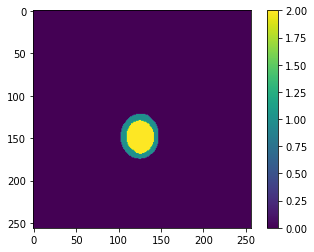

(1, 256, 256)
(256, 256)


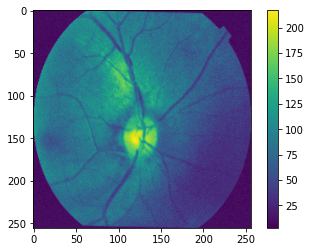

  1%|▏         | 1/80 [00:00<00:34,  2.26it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
1
/content/new_data/train/mask1/drishtiGS_079.png
drishtiGS_079.png
drishtiGS_079.png
(256, 256)


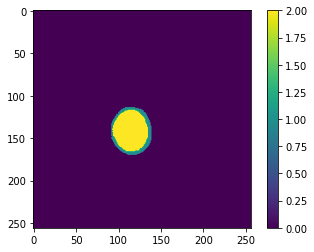

(1, 256, 256)
(256, 256)


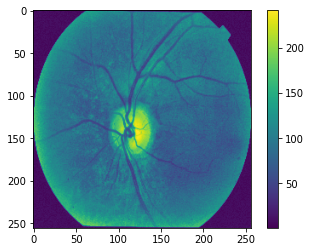

  2%|▎         | 2/80 [00:00<00:38,  2.00it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2
/content/new_data/train/mask1/drishtiGS_055.png
drishtiGS_055.png
drishtiGS_055.png
(256, 256)


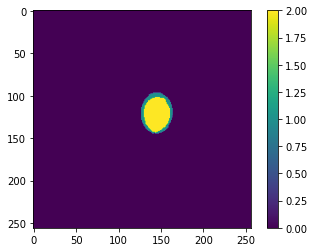

(1, 256, 256)
(256, 256)


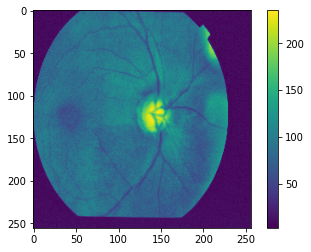

  4%|▍         | 3/80 [00:01<00:35,  2.16it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
3
/content/new_data/train/mask1/drishtiGS_043.png
drishtiGS_043.png
drishtiGS_043.png
(256, 256)


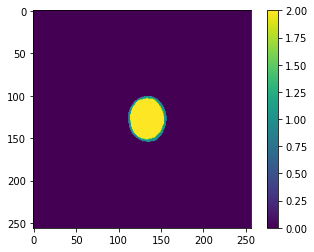

(1, 256, 256)
(256, 256)


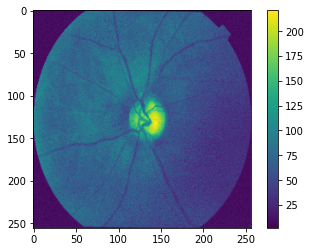

  5%|▌         | 4/80 [00:01<00:34,  2.19it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
4
/content/new_data/train/mask1/drishtiGS_049.png
drishtiGS_049.png
drishtiGS_049.png
(256, 256)


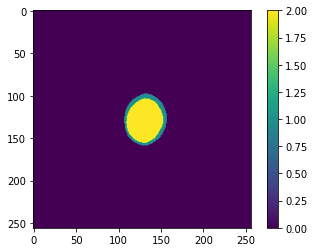

(1, 256, 256)
(256, 256)


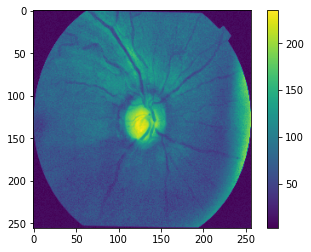

  6%|▋         | 5/80 [00:02<00:34,  2.20it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
5
/content/new_data/train/mask1/drishtiGS_051.png
drishtiGS_051.png
drishtiGS_051.png
(256, 256)


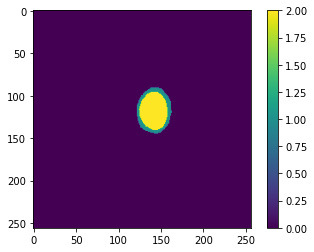

(1, 256, 256)
(256, 256)


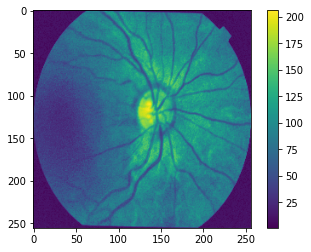

  8%|▊         | 6/80 [00:02<00:33,  2.21it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
6
/content/new_data/train/mask1/drishtiGS_089.png
drishtiGS_089.png
drishtiGS_089.png
(256, 256)


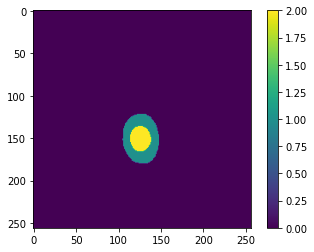

(1, 256, 256)
(256, 256)


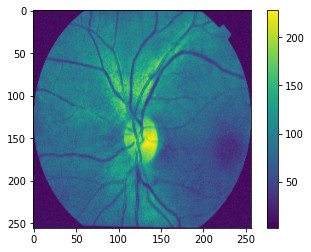

  9%|▉         | 7/80 [00:03<00:32,  2.27it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
7
/content/new_data/train/mask1/drishtiGS_060.png
drishtiGS_060.png
drishtiGS_060.png
(256, 256)


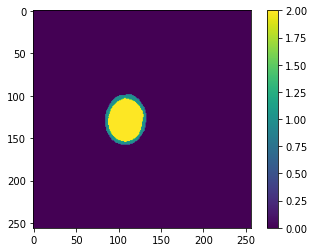

(1, 256, 256)
(256, 256)


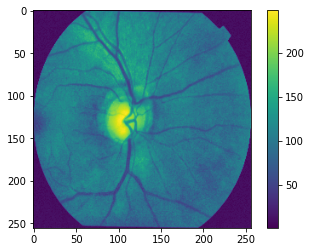

 10%|█         | 8/80 [00:03<00:32,  2.24it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
8
/content/new_data/train/mask1/drishtiGS_059.png
drishtiGS_059.png
drishtiGS_059.png
(256, 256)


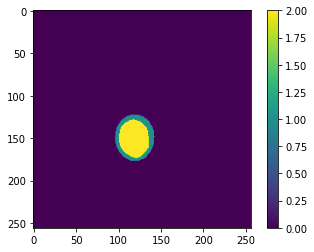

(1, 256, 256)
(256, 256)


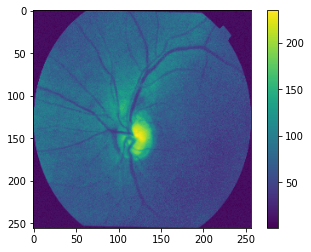

 11%|█▏        | 9/80 [00:04<00:31,  2.25it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
9
/content/new_data/train/mask1/drishtiGS_091.png
drishtiGS_091.png
drishtiGS_091.png
(256, 256)


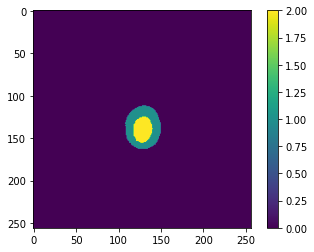

(1, 256, 256)
(256, 256)


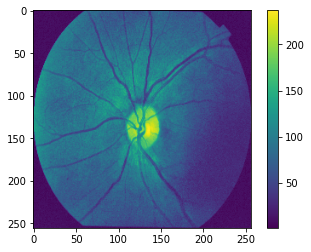

 12%|█▎        | 10/80 [00:04<00:34,  2.01it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
10
/content/new_data/train/mask1/drishtiGS_017.png
drishtiGS_017.png
drishtiGS_017.png
(256, 256)


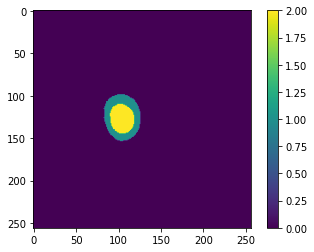

(1, 256, 256)
(256, 256)


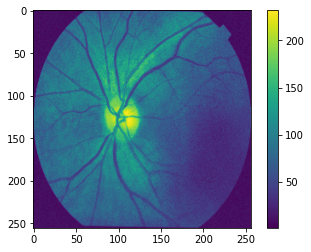

 14%|█▍        | 11/80 [00:05<00:32,  2.12it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
11
/content/new_data/train/mask1/drishtiGS_033.png
drishtiGS_033.png
drishtiGS_033.png
(256, 256)


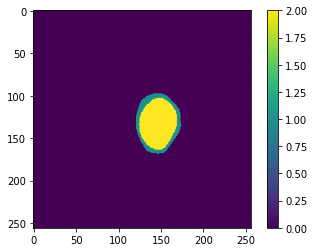

(1, 256, 256)
(256, 256)


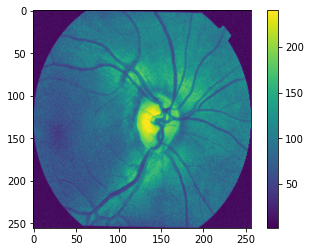

 15%|█▌        | 12/80 [00:05<00:31,  2.14it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
12
/content/new_data/train/mask1/drishtiGS_080.png
drishtiGS_080.png
drishtiGS_080.png
(256, 256)


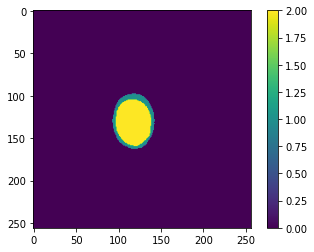

(1, 256, 256)
(256, 256)


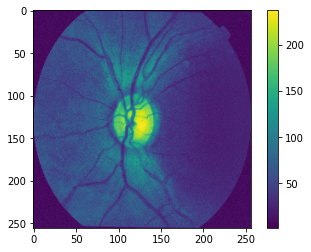

 16%|█▋        | 13/80 [00:05<00:30,  2.18it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
13
/content/new_data/train/mask1/drishtiGS_069.png
drishtiGS_069.png
drishtiGS_069.png
(256, 256)


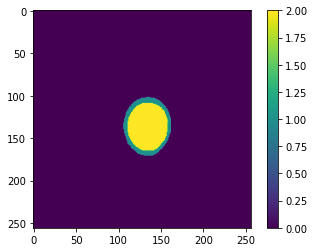

(1, 256, 256)
(256, 256)


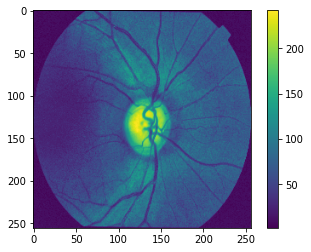

 18%|█▊        | 14/80 [00:06<00:30,  2.15it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
14
/content/new_data/train/mask1/drishtiGS_086.png
drishtiGS_086.png
drishtiGS_086.png
(256, 256)


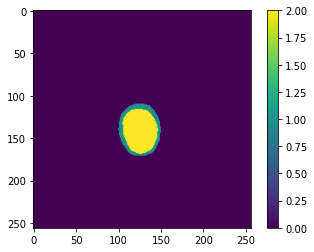

(1, 256, 256)
(256, 256)


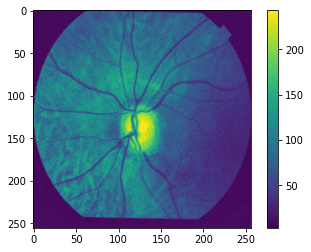

 19%|█▉        | 15/80 [00:06<00:29,  2.17it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
15
/content/new_data/train/mask1/drishtiGS_036.png
drishtiGS_036.png
drishtiGS_036.png
(256, 256)


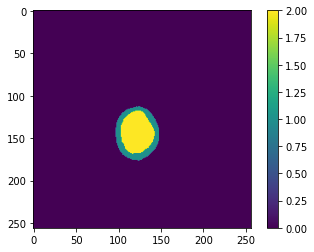

(1, 256, 256)
(256, 256)


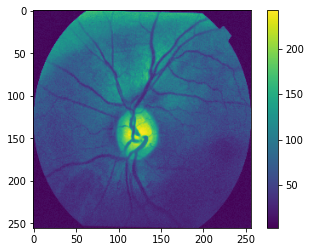

 20%|██        | 16/80 [00:07<00:29,  2.19it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
16
/content/new_data/train/mask1/drishtiGS_053.png
drishtiGS_053.png
drishtiGS_053.png
(256, 256)


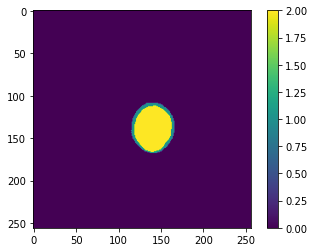

(1, 256, 256)
(256, 256)


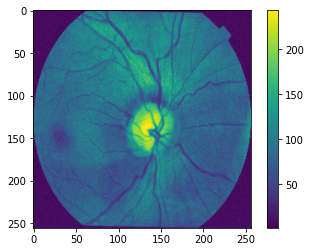

 21%|██▏       | 17/80 [00:07<00:28,  2.21it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
17
/content/new_data/train/mask1/drishtiGS_067.png
drishtiGS_067.png
drishtiGS_067.png
(256, 256)


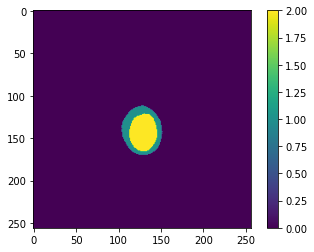

(1, 256, 256)
(256, 256)


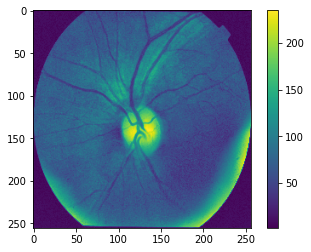

 22%|██▎       | 18/80 [00:08<00:27,  2.21it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
18
/content/new_data/train/mask1/drishtiGS_084.png
drishtiGS_084.png
drishtiGS_084.png
(256, 256)


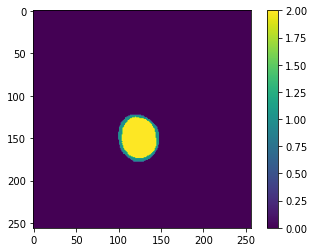

(1, 256, 256)
(256, 256)


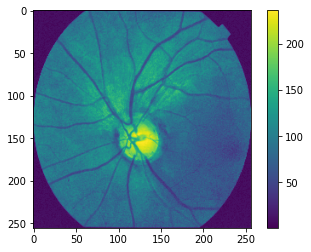

 24%|██▍       | 19/80 [00:08<00:30,  2.02it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
19
/content/new_data/train/mask1/drishtiGS_070.png
drishtiGS_070.png
drishtiGS_070.png
(256, 256)


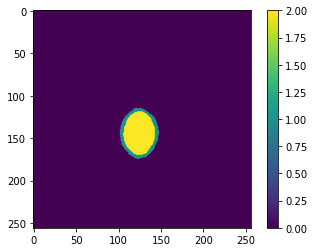

(1, 256, 256)
(256, 256)


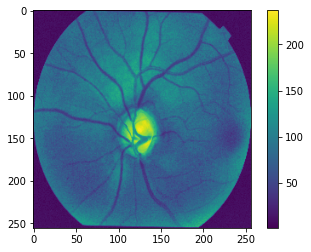

 25%|██▌       | 20/80 [00:09<00:29,  2.01it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
20
/content/new_data/train/mask1/drishtiGS_056.png
drishtiGS_056.png
drishtiGS_056.png
(256, 256)


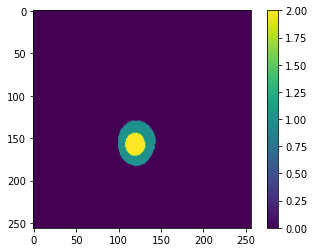

(1, 256, 256)
(256, 256)


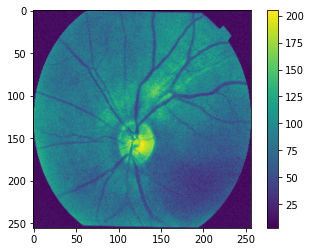

 26%|██▋       | 21/80 [00:09<00:28,  2.06it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
21
/content/new_data/train/mask1/drishtiGS_004.png
drishtiGS_004.png
drishtiGS_004.png
(256, 256)


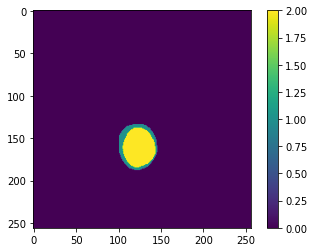

(1, 256, 256)
(256, 256)


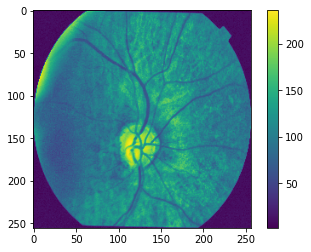

 28%|██▊       | 22/80 [00:10<00:27,  2.11it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
22
/content/new_data/train/mask1/drishtiGS_050.png
drishtiGS_050.png
drishtiGS_050.png
(256, 256)


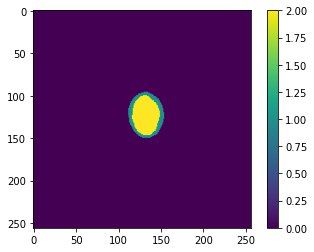

(1, 256, 256)
(256, 256)


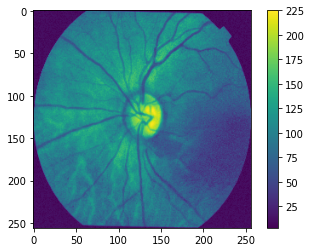

 29%|██▉       | 23/80 [00:10<00:27,  2.10it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
23
/content/new_data/train/mask1/drishtiGS_073.png
drishtiGS_073.png
drishtiGS_073.png
(256, 256)


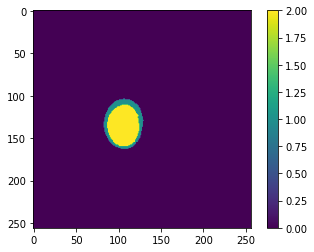

(1, 256, 256)
(256, 256)


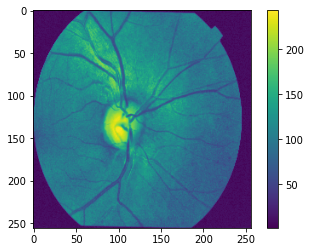

 30%|███       | 24/80 [00:11<00:26,  2.14it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
24
/content/new_data/train/mask1/drishtiGS_024.png
drishtiGS_024.png
drishtiGS_024.png
(256, 256)


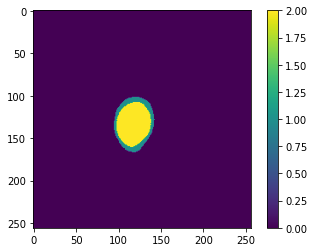

(1, 256, 256)
(256, 256)


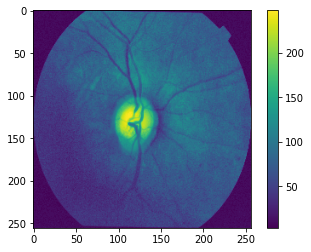

 31%|███▏      | 25/80 [00:11<00:25,  2.14it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
25
/content/new_data/train/mask1/drishtiGS_071.png
drishtiGS_071.png
drishtiGS_071.png
(256, 256)


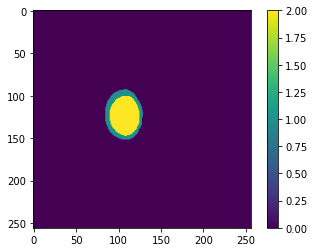

(1, 256, 256)
(256, 256)


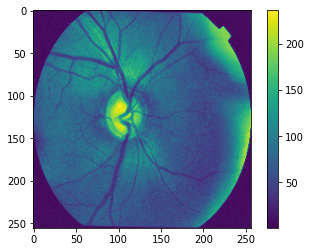

 32%|███▎      | 26/80 [00:12<00:25,  2.14it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
26
/content/new_data/train/mask1/drishtiGS_094.png
drishtiGS_094.png
drishtiGS_094.png
(256, 256)


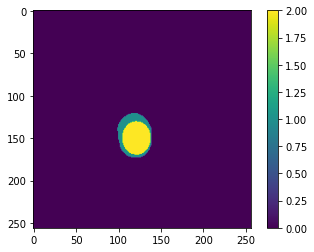

(1, 256, 256)
(256, 256)


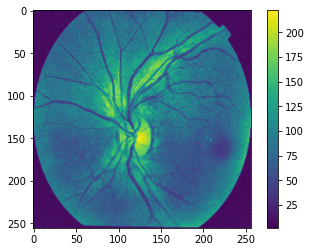

 34%|███▍      | 27/80 [00:12<00:28,  1.87it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
27
/content/new_data/train/mask1/drishtiGS_040.png
drishtiGS_040.png
drishtiGS_040.png
(256, 256)


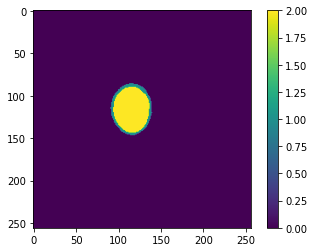

(1, 256, 256)
(256, 256)


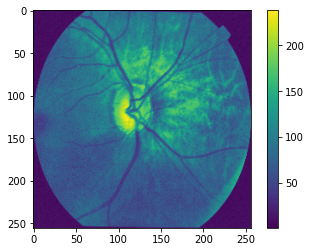

 35%|███▌      | 28/80 [00:13<00:26,  1.95it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
28
/content/new_data/train/mask1/drishtiGS_090.png
drishtiGS_090.png
drishtiGS_090.png
(256, 256)


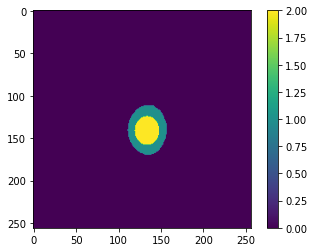

(1, 256, 256)
(256, 256)


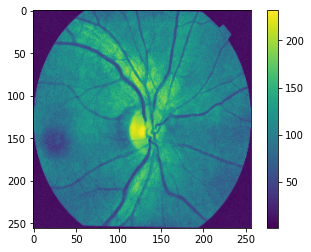

 36%|███▋      | 29/80 [00:13<00:25,  1.99it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
29
/content/new_data/train/mask1/drishtiGS_022.png
drishtiGS_022.png
drishtiGS_022.png
(256, 256)


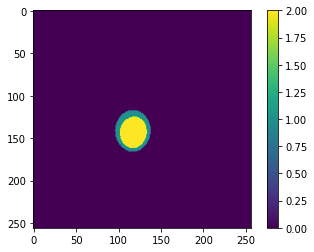

(1, 256, 256)
(256, 256)


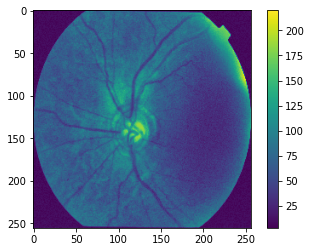

 38%|███▊      | 30/80 [00:14<00:24,  2.01it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
30
/content/new_data/train/mask1/drishtiGS_092.png
drishtiGS_092.png
drishtiGS_092.png
(256, 256)


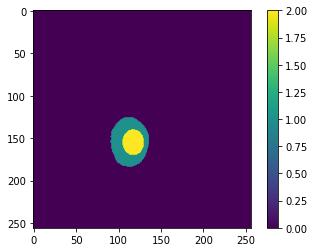

(1, 256, 256)
(256, 256)


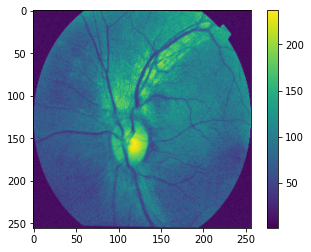

 39%|███▉      | 31/80 [00:14<00:24,  2.01it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
31
/content/new_data/train/mask1/drishtiGS_062.png
drishtiGS_062.png
drishtiGS_062.png
(256, 256)


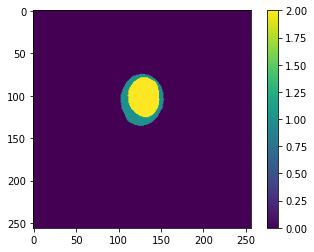

(1, 256, 256)
(256, 256)


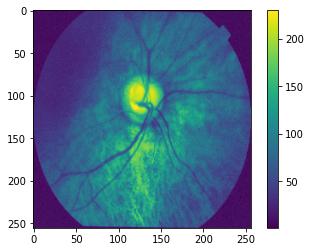

 40%|████      | 32/80 [00:15<00:23,  2.01it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
32
/content/new_data/train/mask1/drishtiGS_042.png
drishtiGS_042.png
drishtiGS_042.png
(256, 256)


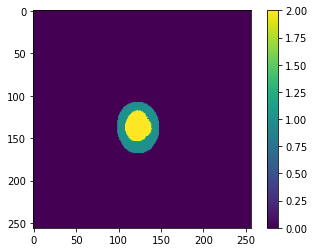

(1, 256, 256)
(256, 256)


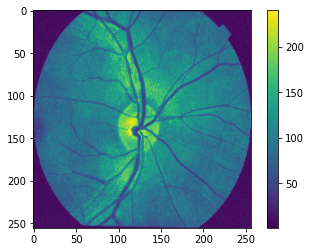

 41%|████▏     | 33/80 [00:15<00:23,  2.04it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
33
/content/new_data/train/mask1/drishtiGS_098.png
drishtiGS_098.png
drishtiGS_098.png
(256, 256)


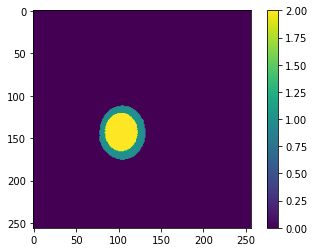

(1, 256, 256)
(256, 256)


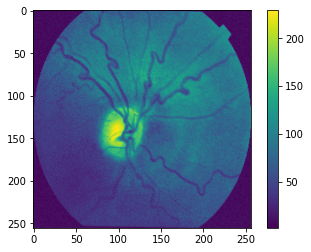

 42%|████▎     | 34/80 [00:16<00:23,  1.99it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
34
/content/new_data/train/mask1/drishtiGS_063.png
drishtiGS_063.png
drishtiGS_063.png
(256, 256)


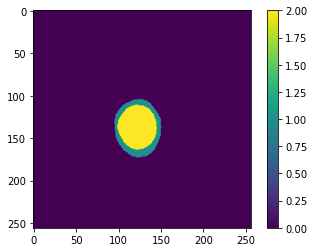

(1, 256, 256)
(256, 256)


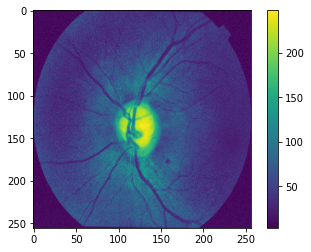

 44%|████▍     | 35/80 [00:16<00:22,  2.02it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
35
/content/new_data/train/mask1/drishtiGS_085.png
drishtiGS_085.png
drishtiGS_085.png
(256, 256)


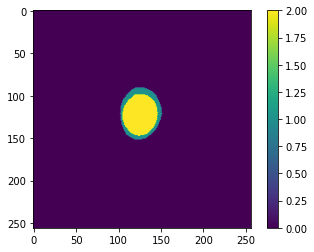

(1, 256, 256)
(256, 256)


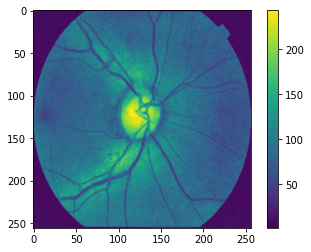

 45%|████▌     | 36/80 [00:17<00:23,  1.86it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
36
/content/new_data/train/mask1/drishtiGS_068.png
drishtiGS_068.png
drishtiGS_068.png
(256, 256)


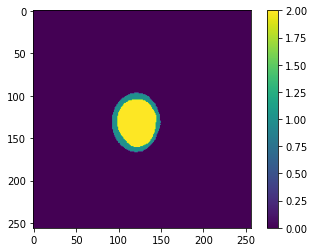

(1, 256, 256)
(256, 256)


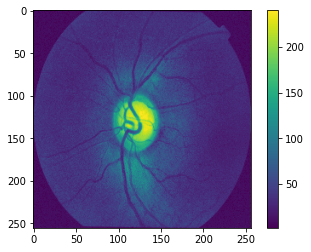

 46%|████▋     | 37/80 [00:17<00:22,  1.91it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
37
/content/new_data/train/mask1/drishtiGS_078.png
drishtiGS_078.png
drishtiGS_078.png
(256, 256)


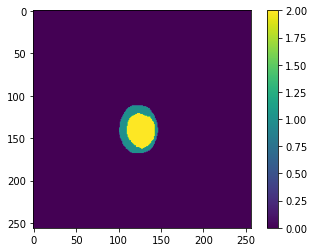

(1, 256, 256)
(256, 256)


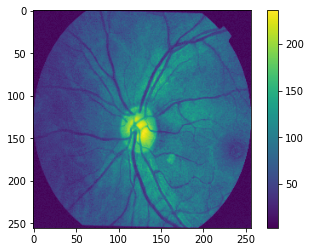

 48%|████▊     | 38/80 [00:18<00:21,  1.95it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
38
/content/new_data/train/mask1/drishtiGS_046.png
drishtiGS_046.png
drishtiGS_046.png
(256, 256)


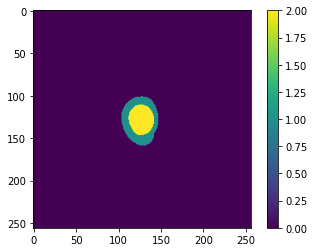

(1, 256, 256)
(256, 256)


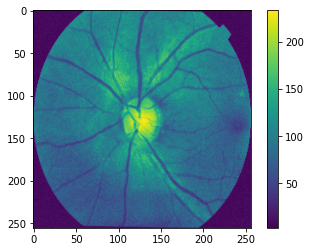

 49%|████▉     | 39/80 [00:18<00:21,  1.93it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
39
/content/new_data/train/mask1/drishtiGS_002.png
drishtiGS_002.png
drishtiGS_002.png
(256, 256)


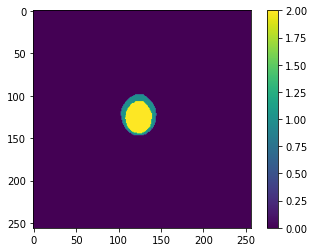

(1, 256, 256)
(256, 256)


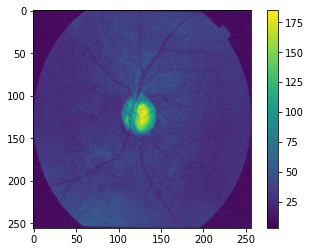

 50%|█████     | 40/80 [00:19<00:20,  1.94it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
40
/content/new_data/train/mask1/drishtiGS_032.png
drishtiGS_032.png
drishtiGS_032.png
(256, 256)


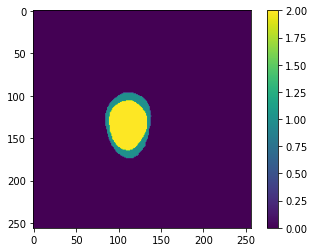

(1, 256, 256)
(256, 256)


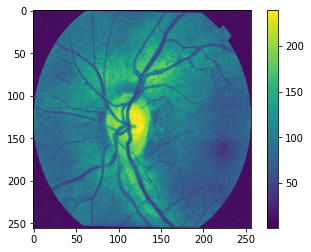

 51%|█████▏    | 41/80 [00:19<00:20,  1.93it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
41
/content/new_data/train/mask1/drishtiGS_096.png
drishtiGS_096.png
drishtiGS_096.png
(256, 256)


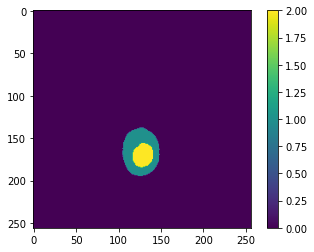

(1, 256, 256)
(256, 256)


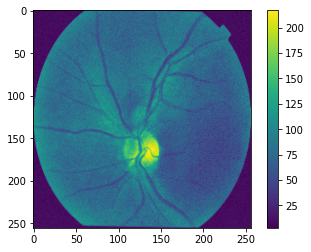

 52%|█████▎    | 42/80 [00:20<00:19,  1.94it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
42
/content/new_data/train/mask1/drishtiGS_083.png
drishtiGS_083.png
drishtiGS_083.png
(256, 256)


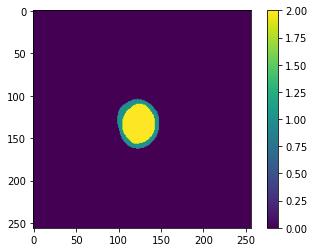

(1, 256, 256)
(256, 256)


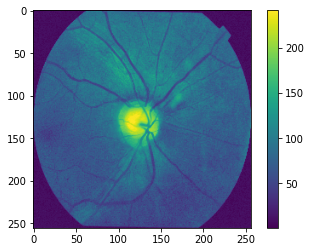

 54%|█████▍    | 43/80 [00:20<00:19,  1.94it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
43
/content/new_data/train/mask1/drishtiGS_010.png
drishtiGS_010.png
drishtiGS_010.png
(256, 256)


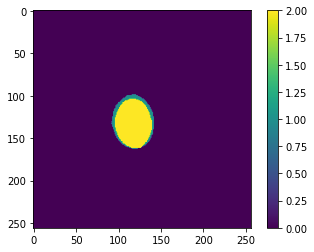

(1, 256, 256)
(256, 256)


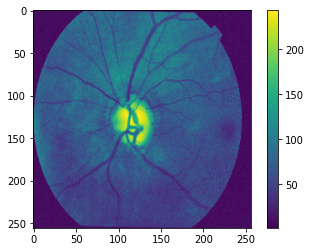

 55%|█████▌    | 44/80 [00:21<00:20,  1.76it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
44
/content/new_data/train/mask1/drishtiGS_061.png
drishtiGS_061.png
drishtiGS_061.png
(256, 256)


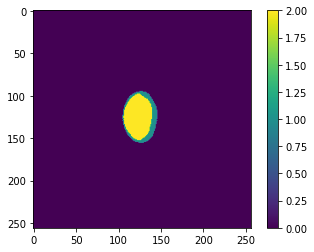

(1, 256, 256)
(256, 256)


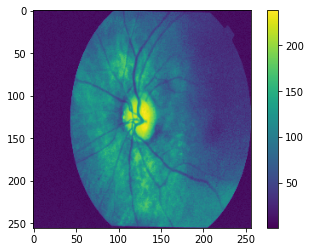

 56%|█████▋    | 45/80 [00:22<00:19,  1.84it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
45
/content/new_data/train/mask1/drishtiGS_075.png
drishtiGS_075.png
drishtiGS_075.png
(256, 256)


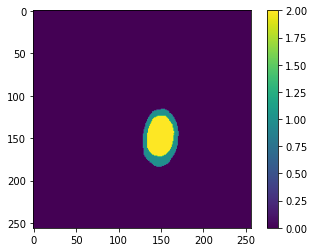

(1, 256, 256)
(256, 256)


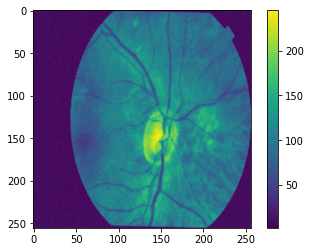

 57%|█████▊    | 46/80 [00:22<00:18,  1.87it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
46
/content/new_data/train/mask1/drishtiGS_058.png
drishtiGS_058.png
drishtiGS_058.png
(256, 256)


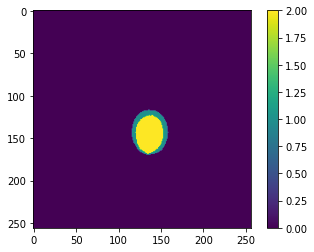

(1, 256, 256)
(256, 256)


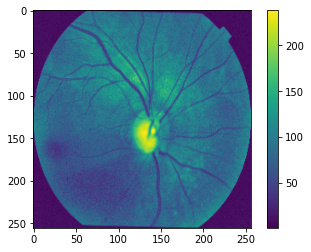

 59%|█████▉    | 47/80 [00:23<00:17,  1.87it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
47
/content/new_data/train/mask1/drishtiGS_026.png
drishtiGS_026.png
drishtiGS_026.png
(256, 256)


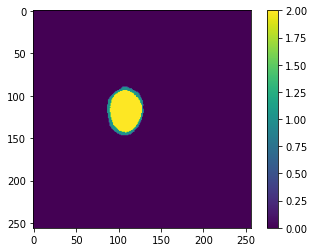

(1, 256, 256)
(256, 256)


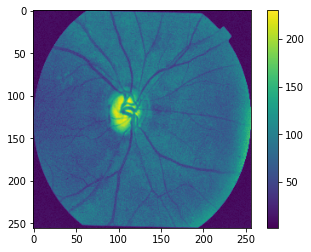

 60%|██████    | 48/80 [00:23<00:17,  1.84it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
48
/content/new_data/train/mask1/drishtiGS_038.png
drishtiGS_038.png
drishtiGS_038.png
(256, 256)


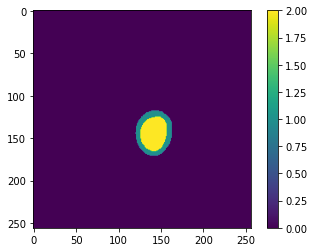

(1, 256, 256)
(256, 256)


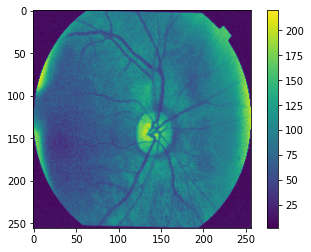

 61%|██████▏   | 49/80 [00:24<00:17,  1.81it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
49
/content/new_data/train/mask1/drishtiGS_101.png
drishtiGS_101.png
drishtiGS_101.png
(256, 256)


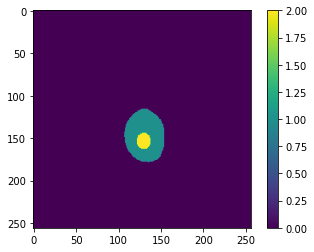

(1, 256, 256)
(256, 256)


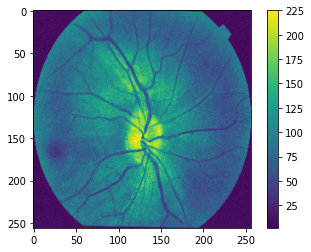

 62%|██████▎   | 50/80 [00:24<00:16,  1.84it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
50
/content/new_data/train/mask1/drishtiGS_087.png
drishtiGS_087.png
drishtiGS_087.png
(256, 256)


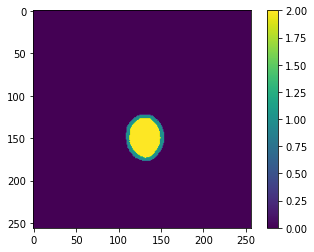

(1, 256, 256)
(256, 256)


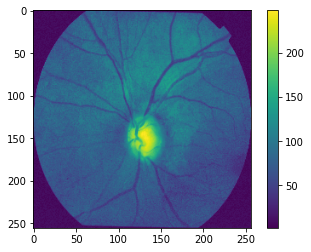

 64%|██████▍   | 51/80 [00:25<00:15,  1.85it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
51
/content/new_data/train/mask1/drishtiGS_016.png
drishtiGS_016.png
drishtiGS_016.png
(256, 256)


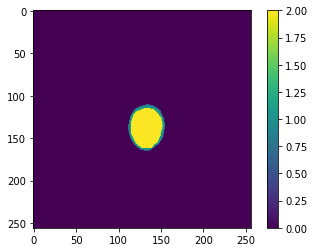

(1, 256, 256)
(256, 256)


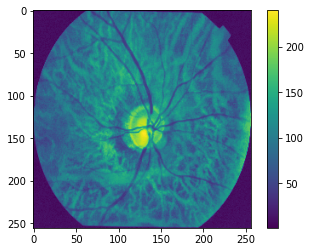

 65%|██████▌   | 52/80 [00:25<00:14,  1.87it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
52
/content/new_data/train/mask1/drishtiGS_048.png
drishtiGS_048.png
drishtiGS_048.png
(256, 256)


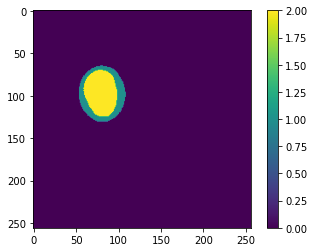

(1, 256, 256)
(256, 256)


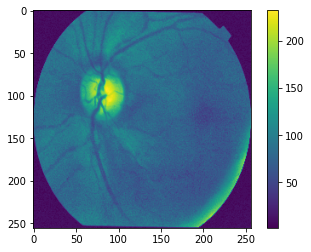

 66%|██████▋   | 53/80 [00:26<00:15,  1.75it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
53
/content/new_data/train/mask1/drishtiGS_031.png
drishtiGS_031.png
drishtiGS_031.png
(256, 256)


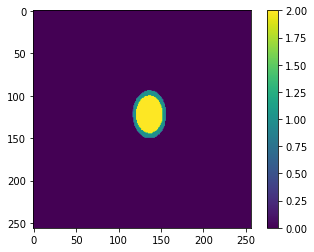

(1, 256, 256)
(256, 256)


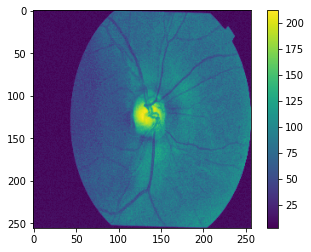

 68%|██████▊   | 54/80 [00:27<00:15,  1.73it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
54
/content/new_data/train/mask1/drishtiGS_076.png
drishtiGS_076.png
drishtiGS_076.png
(256, 256)


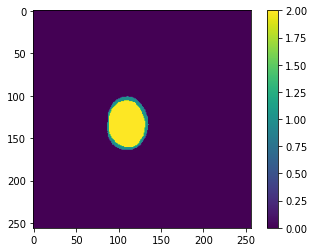

(1, 256, 256)
(256, 256)


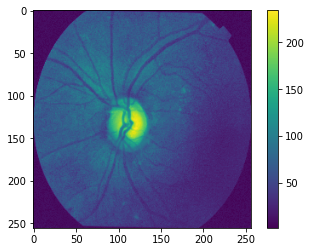

 69%|██████▉   | 55/80 [00:27<00:14,  1.78it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
55
/content/new_data/train/mask1/drishtiGS_065.png
drishtiGS_065.png
drishtiGS_065.png
(256, 256)


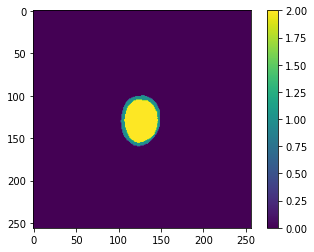

(1, 256, 256)
(256, 256)


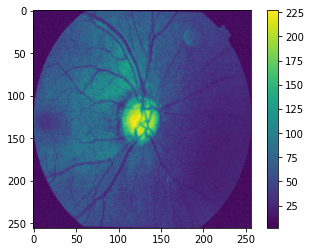

 70%|███████   | 56/80 [00:28<00:13,  1.78it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
56
/content/new_data/train/mask1/drishtiGS_015.png
drishtiGS_015.png
drishtiGS_015.png
(256, 256)


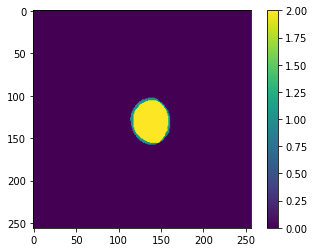

(1, 256, 256)
(256, 256)


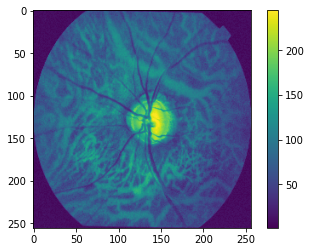

 71%|███████▏  | 57/80 [00:28<00:12,  1.83it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
57
/content/new_data/train/mask1/drishtiGS_035.png
drishtiGS_035.png
drishtiGS_035.png
(256, 256)


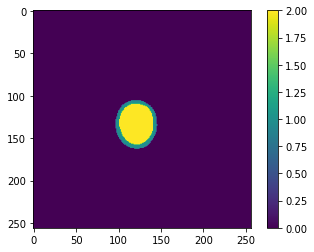

(1, 256, 256)
(256, 256)


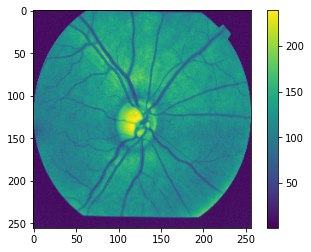

 72%|███████▎  | 58/80 [00:29<00:12,  1.81it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
58
/content/new_data/train/mask1/drishtiGS_054.png
drishtiGS_054.png
drishtiGS_054.png
(256, 256)


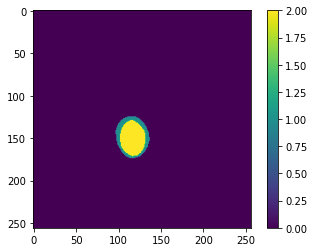

(1, 256, 256)
(256, 256)


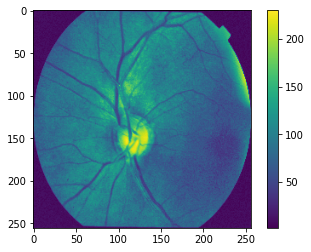

 74%|███████▍  | 59/80 [00:29<00:11,  1.84it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
59
/content/new_data/train/mask1/drishtiGS_072.png
drishtiGS_072.png
drishtiGS_072.png
(256, 256)


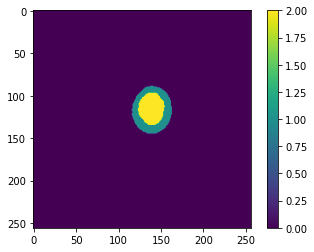

(1, 256, 256)
(256, 256)


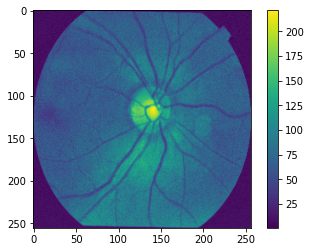

 75%|███████▌  | 60/80 [00:30<00:11,  1.81it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
60
/content/new_data/train/mask1/drishtiGS_052.png
drishtiGS_052.png
drishtiGS_052.png
(256, 256)


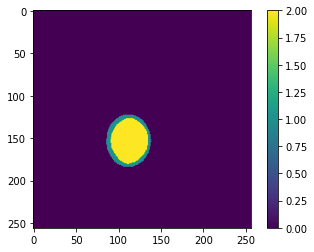

(1, 256, 256)
(256, 256)


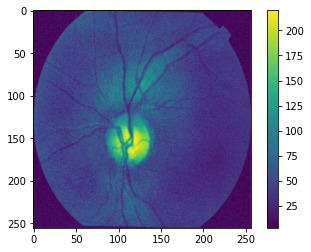

 76%|███████▋  | 61/80 [00:31<00:11,  1.67it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
61
/content/new_data/train/mask1/drishtiGS_095.png
drishtiGS_095.png
drishtiGS_095.png
(256, 256)


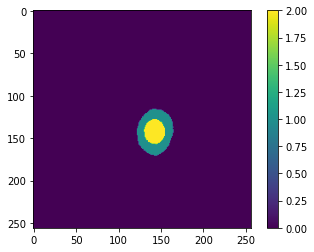

(1, 256, 256)
(256, 256)


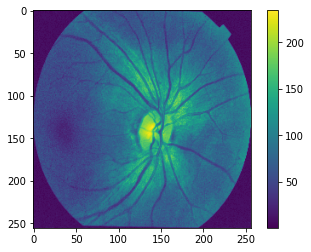

 78%|███████▊  | 62/80 [00:31<00:10,  1.74it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
62
/content/new_data/train/mask1/drishtiGS_064.png
drishtiGS_064.png
drishtiGS_064.png
(256, 256)


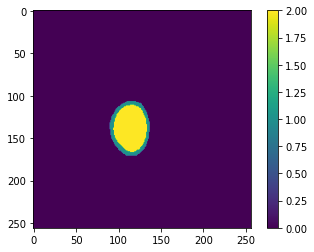

(1, 256, 256)
(256, 256)


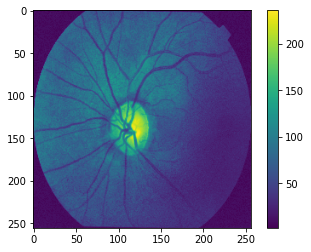

 79%|███████▉  | 63/80 [00:32<00:09,  1.74it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
63
/content/new_data/train/mask1/drishtiGS_066.png
drishtiGS_066.png
drishtiGS_066.png
(256, 256)


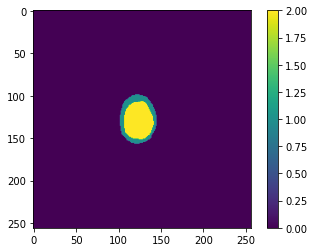

(1, 256, 256)
(256, 256)


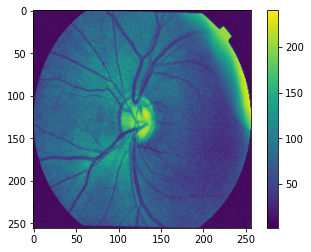

 80%|████████  | 64/80 [00:32<00:08,  1.78it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
64
/content/new_data/train/mask1/drishtiGS_037.png
drishtiGS_037.png
drishtiGS_037.png
(256, 256)


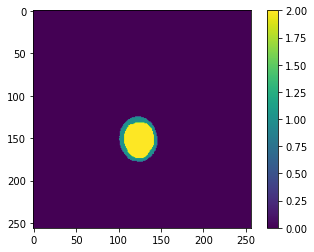

(1, 256, 256)
(256, 256)


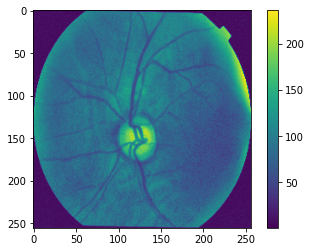

 81%|████████▏ | 65/80 [00:33<00:08,  1.75it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
65
/content/new_data/train/mask1/drishtiGS_099.png
drishtiGS_099.png
drishtiGS_099.png
(256, 256)


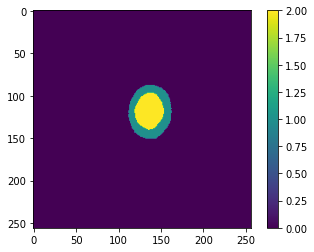

(1, 256, 256)
(256, 256)


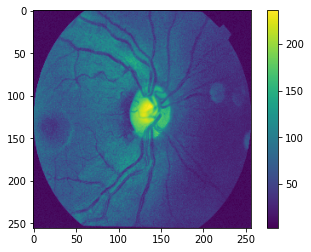

 82%|████████▎ | 66/80 [00:33<00:07,  1.78it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
66
/content/new_data/train/mask1/drishtiGS_081.png
drishtiGS_081.png
drishtiGS_081.png
(256, 256)


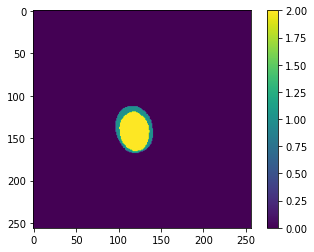

(1, 256, 256)
(256, 256)


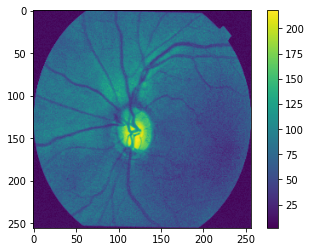

 84%|████████▍ | 67/80 [00:34<00:07,  1.75it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
67
/content/new_data/train/mask1/drishtiGS_012.png
drishtiGS_012.png
drishtiGS_012.png
(256, 256)


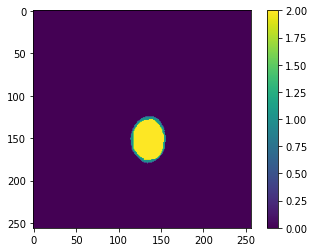

(1, 256, 256)
(256, 256)


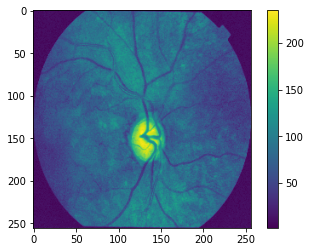

 85%|████████▌ | 68/80 [00:34<00:06,  1.78it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
68
/content/new_data/train/mask1/drishtiGS_008.png
drishtiGS_008.png
drishtiGS_008.png
(256, 256)


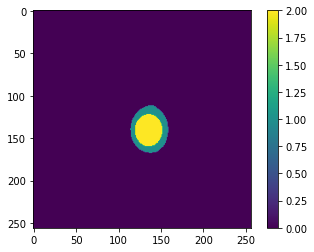

(1, 256, 256)
(256, 256)


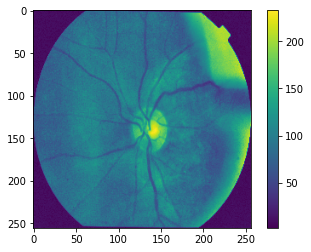

 86%|████████▋ | 69/80 [00:35<00:06,  1.76it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
69
/content/new_data/train/mask1/drishtiGS_074.png
drishtiGS_074.png
drishtiGS_074.png
(256, 256)


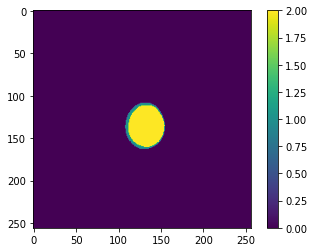

(1, 256, 256)
(256, 256)


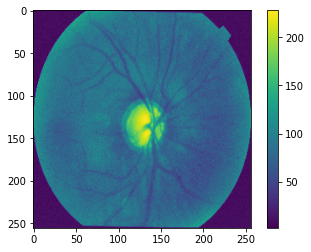

 88%|████████▊ | 70/80 [00:36<00:06,  1.60it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
70
/content/new_data/train/mask1/drishtiGS_041.png
drishtiGS_041.png
drishtiGS_041.png
(256, 256)


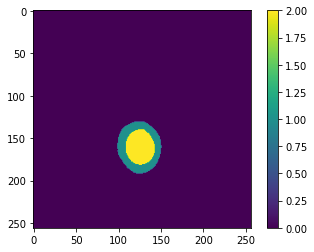

(1, 256, 256)
(256, 256)


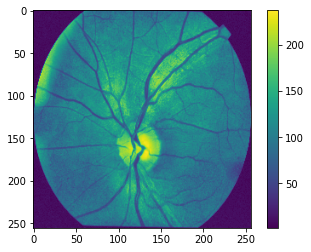

 89%|████████▉ | 71/80 [00:36<00:05,  1.66it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
71
/content/new_data/train/mask1/drishtiGS_093.png
drishtiGS_093.png
drishtiGS_093.png
(256, 256)


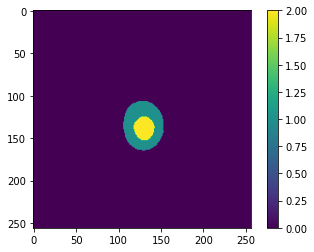

(1, 256, 256)
(256, 256)


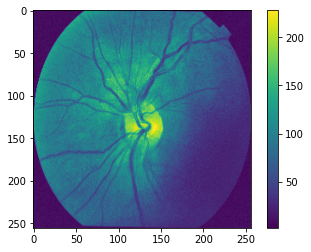

 90%|█████████ | 72/80 [00:37<00:04,  1.67it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
72
/content/new_data/train/mask1/drishtiGS_057.png
drishtiGS_057.png
drishtiGS_057.png
(256, 256)


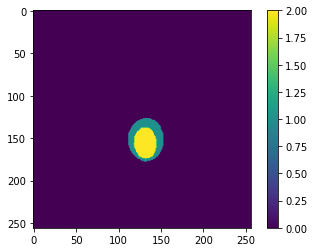

(1, 256, 256)
(256, 256)


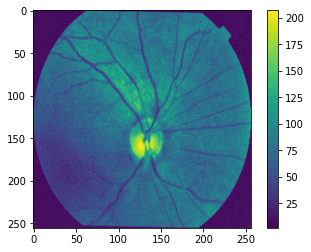

 91%|█████████▏| 73/80 [00:38<00:04,  1.71it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
73
/content/new_data/train/mask1/drishtiGS_077.png
drishtiGS_077.png
drishtiGS_077.png
(256, 256)


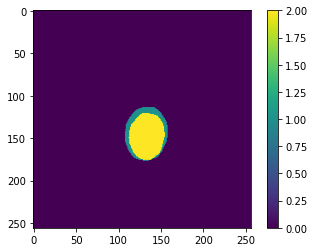

(1, 256, 256)
(256, 256)


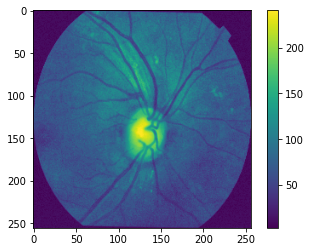

 92%|█████████▎| 74/80 [00:38<00:03,  1.71it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
74
/content/new_data/train/mask1/drishtiGS_047.png
drishtiGS_047.png
drishtiGS_047.png
(256, 256)


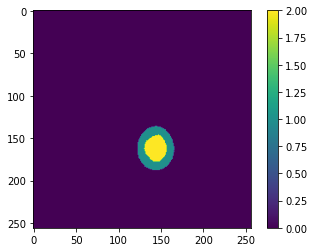

(1, 256, 256)
(256, 256)


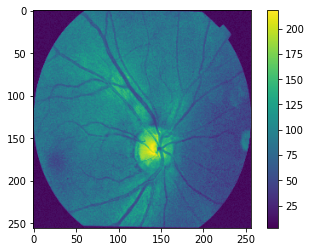

 94%|█████████▍| 75/80 [00:39<00:02,  1.68it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
75
/content/new_data/train/mask1/drishtiGS_045.png
drishtiGS_045.png
drishtiGS_045.png
(256, 256)


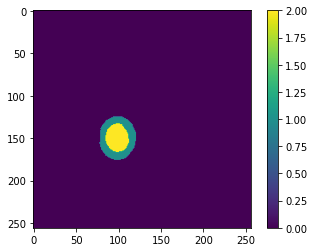

(1, 256, 256)
(256, 256)


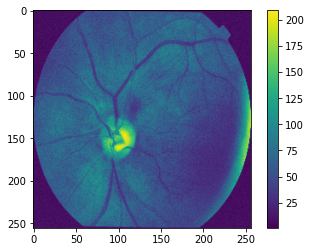

 95%|█████████▌| 76/80 [00:39<00:02,  1.69it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
76
/content/new_data/train/mask1/drishtiGS_082.png
drishtiGS_082.png
drishtiGS_082.png
(256, 256)


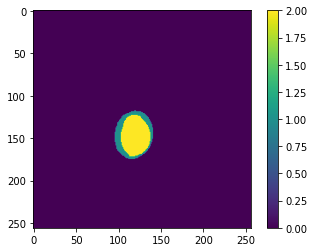

(1, 256, 256)
(256, 256)


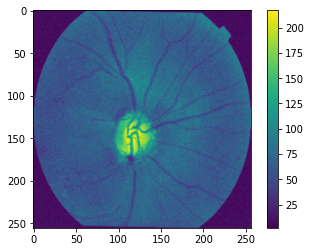

 96%|█████████▋| 77/80 [00:40<00:01,  1.69it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
77
/content/new_data/train/mask1/drishtiGS_097.png
drishtiGS_097.png
drishtiGS_097.png
(256, 256)


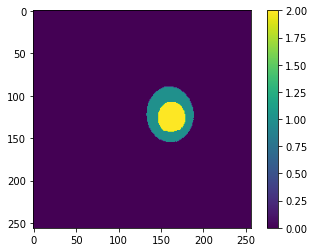

(1, 256, 256)
(256, 256)


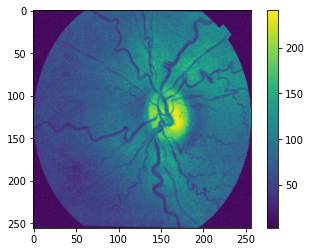

 98%|█████████▊| 78/80 [00:41<00:01,  1.59it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
78
/content/new_data/train/mask1/drishtiGS_018.png
drishtiGS_018.png
drishtiGS_018.png
(256, 256)


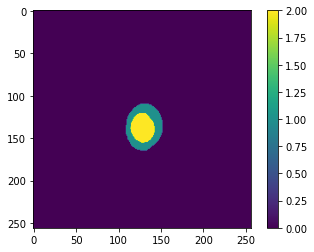

(1, 256, 256)
(256, 256)


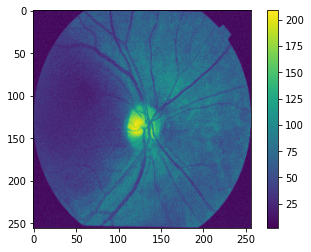

 99%|█████████▉| 79/80 [00:41<00:00,  1.60it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
79
/content/new_data/train/mask1/drishtiGS_044.png
drishtiGS_044.png
drishtiGS_044.png
(256, 256)


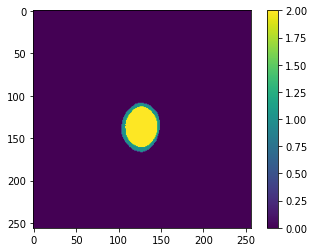

(1, 256, 256)
(256, 256)


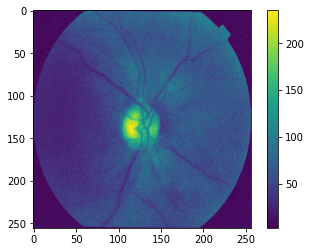

100%|██████████| 80/80 [00:42<00:00,  1.89it/s]

(80, 256, 256, 1)
(80, 256, 256, 1)
float32


In [2]:
import os
import numpy as np
from PIL import Image
from numpy import zeros, newaxis
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
from glob import glob
from tqdm import tqdm
import tensorflow as tf

#Resizing images, if needed
SIZE_X = 256 
SIZE_Y = 256

def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)

if __name__ == "__main__":
    """ Seeding """
    np.random.seed(42)

    folder_train_y1 = "/content/new_data/train/mask1/"
    train_y1 = os.listdir(folder_train_y1)
    train_y1.sort(key = len)

    folder_train_y2 = "/content/new_data/train/mask2/"
    train_y2 = os.listdir(folder_train_y2)
    train_y2.sort(key = len)

    folder_train_y3 = "/content/new_data/train/image/"
    train_y3 = os.listdir(folder_train_y3)
    train_y3.sort(key = len)

    image_row_size = 256
    image_col_size = 256

    train_mask = np.ndarray((len(train_y1), image_row_size , image_col_size), dtype = np.uint8)
    #train_images = np.ndarray((len(train_y3), image_row_size , image_col_size), dtype = np.uint8)
    #Capture training image info as a list
    train_images = []

    count = 0
    for x, y, z in tqdm(zip(train_y1, train_y2, train_y3 ), total=len(train_y1)):
      print('@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@')
      print(count)
      print(folder_train_y1+x)
      print(y)
      print(z)
      # read mask 1
      mask1 = cv2.imread(folder_train_y1+x, cv2.IMREAD_COLOR)
      mask1 = cv2.resize(mask1,(256,256), interpolation = cv2.INTER_NEAREST)
      mask1 = np.sum(mask1, axis=2)
      mask1[mask1>0] = 1
      mask1 = mask1

      #read mask 2
      mask2 = cv2.imread(folder_train_y2+y, cv2.IMREAD_COLOR)
      mask2 = cv2.resize(mask2,(256,256), interpolation = cv2.INTER_NEAREST)
      mask2 = np.mean(mask2, axis=2)
      mask2[mask2>0] = 1
      mask2 = mask2*2

      # combine mask
      mask3 = mask1+mask2
      mask3[mask3==3]=2

      print(mask3.shape)
  
      plt.imshow(mask3)
      plt.colorbar()
      plt.show()
      msk = np.array([mask3])
      print(msk.shape)
      train_mask[count] = msk

      img = cv2.imread(folder_train_y3+z, 0)       
      img = cv2.resize(img, (SIZE_Y, SIZE_X), interpolation = cv2.INTER_NEAREST)
      print(img.shape)
      plt.imshow(img)
      plt.colorbar()
      plt.show()
      train_images.append(img)


      count = count + 1

    train_mask = np.expand_dims(train_mask,3)
    print(train_mask.shape)
    np.save('train_mask.npy', train_mask) 

    #Convert list to array for machine learning processing        
    train_images = np.array(train_images)

    #################################################
    train_images = np.expand_dims(train_images, axis=3)
    train_images = train_images/255.0
    train_images = train_images.astype(np.float32)

    print(train_images.shape)
    print(train_images.dtype)
        
    np.save('train_image.npy', train_images)  

    def load_train_data():
        images_train = np.load('train_image.npy')
        print('======Loading of Train Data=======')
        return images_train
          

    def load_train_mask():
        images_train = np.load('train_mask.npy')
        print('======Loading of Train Data=======')
        return images_train

In [3]:

Y_train = load_train_mask()
#Y_test = load_test_mask()
print("Mask data shape is: ", Y_train.shape)

======Loading of Train Data=======
Mask data shape is:  (80, 256, 256, 1)


In [4]:
print("Class values in the dataset are ... ", np.unique(Y_train)) 

Class values in the dataset are ...  [0 1 2]


In [5]:
X_train = load_train_data()
#X_test = load_test_data()

print("Image data shape is: ", X_train.shape)

print("Max pixel value in image is: ", X_train.max())

======Loading of Train Data=======
Image data shape is:  (80, 256, 256, 1)
Max pixel value in image is:  0.972549


55


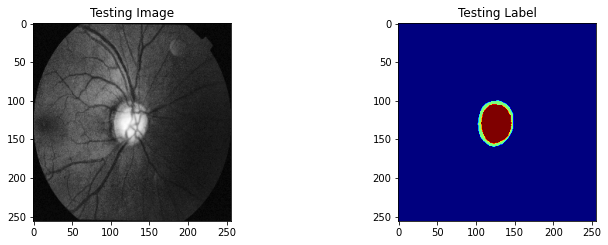

In [6]:
import random
test_img_number = random.randint(0, len(X_train)-1)
print(test_img_number)
test_img = X_train[test_img_number]
ground_truth=Y_train[test_img_number]
plt.figure(figsize=(12, 8))
plt.subplot(221)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(222)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0], cmap='jet')

# Data Test

  0%|          | 0/16 [00:00<?, ?it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
0
/content/new_data/test/mask1/drishtiGS_007.png
drishtiGS_007.png
drishtiGS_007.png
(256, 256)


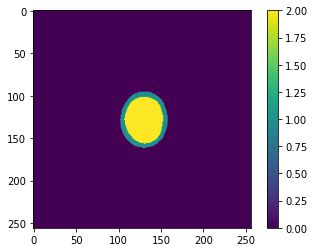

(1, 256, 256)
(256, 256)


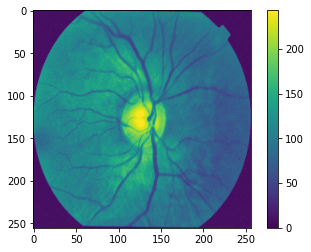

  6%|▋         | 1/16 [00:00<00:06,  2.43it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
1
/content/new_data/test/mask1/drishtiGS_011.png
drishtiGS_011.png
drishtiGS_011.png
(256, 256)


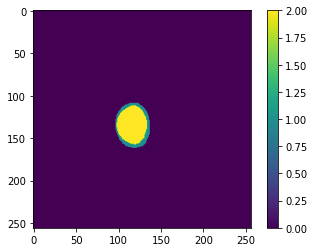

(1, 256, 256)
(256, 256)


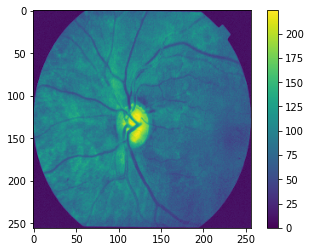

 12%|█▎        | 2/16 [00:00<00:05,  2.44it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
2
/content/new_data/test/mask1/drishtiGS_001.png
drishtiGS_001.png
drishtiGS_001.png
(256, 256)


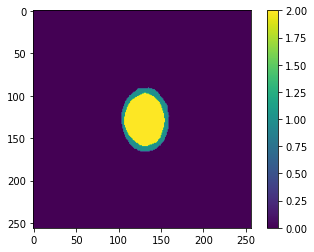

(1, 256, 256)
(256, 256)


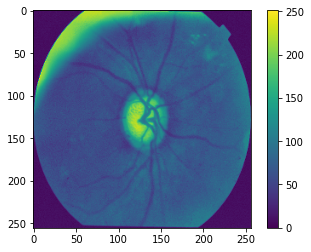

 19%|█▉        | 3/16 [00:01<00:05,  2.41it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
3
/content/new_data/test/mask1/drishtiGS_019.png
drishtiGS_019.png
drishtiGS_019.png
(256, 256)


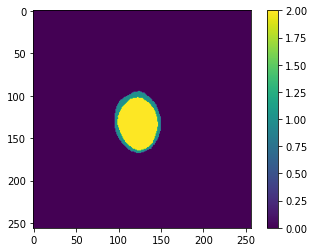

(1, 256, 256)
(256, 256)


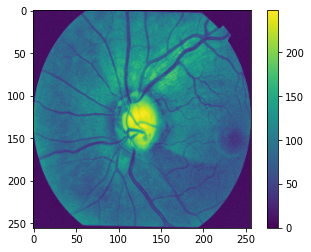

 25%|██▌       | 4/16 [00:01<00:05,  2.40it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
4
/content/new_data/test/mask1/drishtiGS_034.png
drishtiGS_034.png
drishtiGS_034.png
(256, 256)


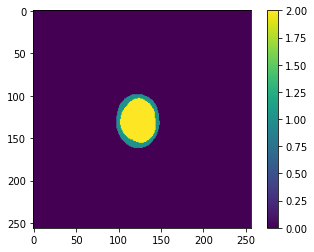

(1, 256, 256)
(256, 256)


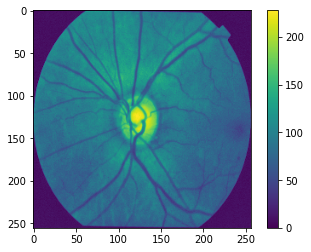

 31%|███▏      | 5/16 [00:02<00:04,  2.39it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
5
/content/new_data/test/mask1/drishtiGS_028.png
drishtiGS_028.png
drishtiGS_028.png
(256, 256)


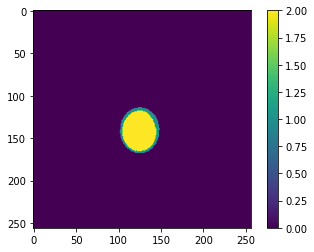

(1, 256, 256)
(256, 256)


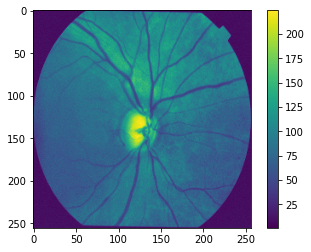

 38%|███▊      | 6/16 [00:02<00:04,  2.13it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
6
/content/new_data/test/mask1/drishtiGS_025.png
drishtiGS_025.png
drishtiGS_025.png
(256, 256)


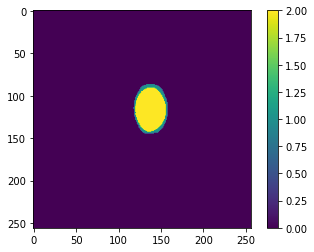

(1, 256, 256)
(256, 256)


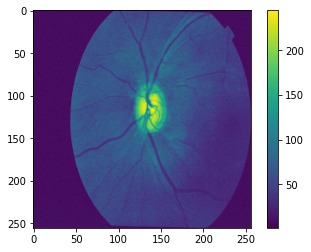

 44%|████▍     | 7/16 [00:03<00:04,  2.16it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
7
/content/new_data/test/mask1/drishtiGS_014.png
drishtiGS_014.png
drishtiGS_014.png
(256, 256)


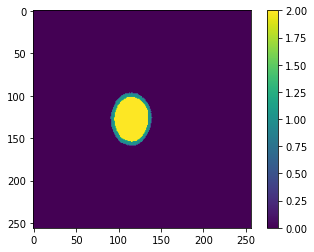

(1, 256, 256)
(256, 256)


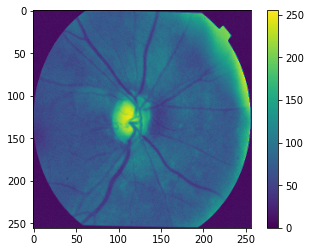

 50%|█████     | 8/16 [00:03<00:03,  2.22it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
8
/content/new_data/test/mask1/drishtiGS_009.png
drishtiGS_009.png
drishtiGS_009.png
(256, 256)


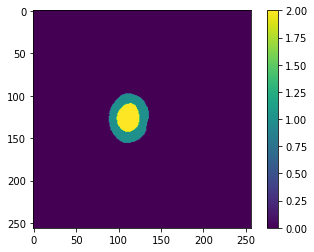

(1, 256, 256)
(256, 256)


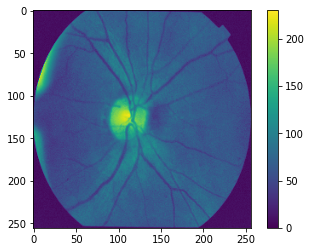

 56%|█████▋    | 9/16 [00:03<00:03,  2.26it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
9
/content/new_data/test/mask1/drishtiGS_006.png
drishtiGS_006.png
drishtiGS_006.png
(256, 256)


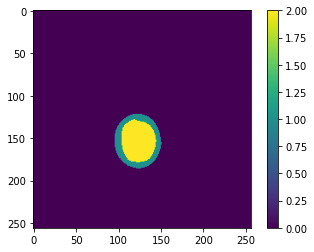

(1, 256, 256)
(256, 256)


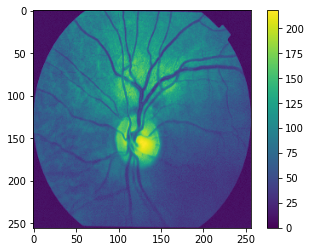

 62%|██████▎   | 10/16 [00:04<00:02,  2.26it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
10
/content/new_data/test/mask1/drishtiGS_021.png
drishtiGS_021.png
drishtiGS_021.png
(256, 256)


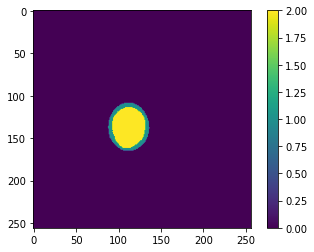

(1, 256, 256)
(256, 256)


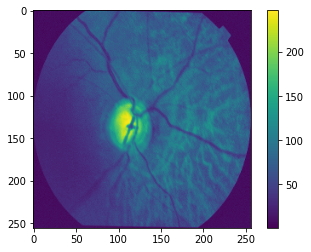

 69%|██████▉   | 11/16 [00:04<00:02,  2.28it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
11
/content/new_data/test/mask1/drishtiGS_030.png
drishtiGS_030.png
drishtiGS_030.png
(256, 256)


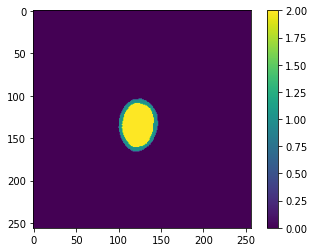

(1, 256, 256)
(256, 256)


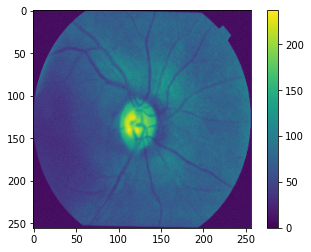

 75%|███████▌  | 12/16 [00:05<00:01,  2.20it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
12
/content/new_data/test/mask1/drishtiGS_003.png
drishtiGS_003.png
drishtiGS_003.png
(256, 256)


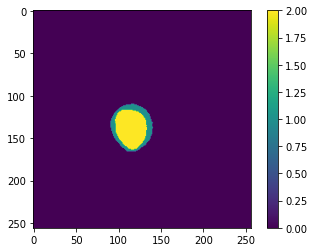

(1, 256, 256)
(256, 256)


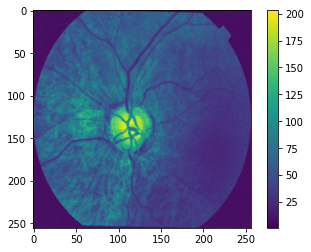

 81%|████████▏ | 13/16 [00:05<00:01,  2.20it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
13
/content/new_data/test/mask1/drishtiGS_020.png
drishtiGS_020.png
drishtiGS_020.png
(256, 256)


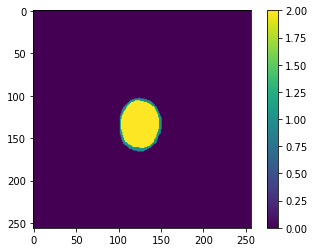

(1, 256, 256)
(256, 256)


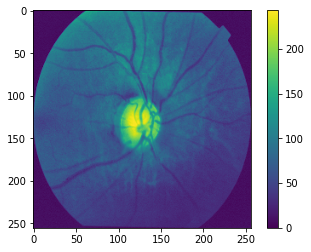

 88%|████████▊ | 14/16 [00:06<00:01,  1.97it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
14
/content/new_data/test/mask1/drishtiGS_013.png
drishtiGS_013.png
drishtiGS_013.png
(256, 256)


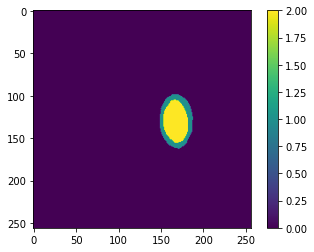

(1, 256, 256)
(256, 256)


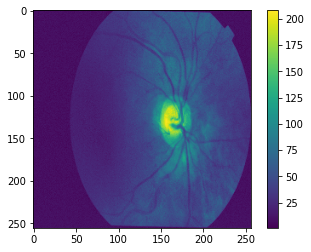

 94%|█████████▍| 15/16 [00:06<00:00,  2.01it/s]

@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@
15
/content/new_data/test/mask1/drishtiGS_005.png
drishtiGS_005.png
drishtiGS_005.png
(256, 256)


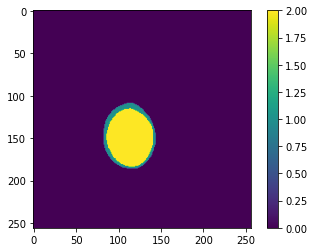

(1, 256, 256)
(256, 256)


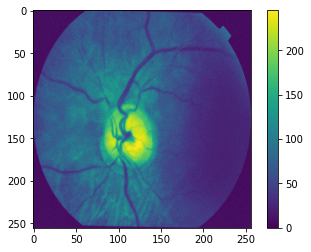

100%|██████████| 16/16 [00:07<00:00,  2.18it/s]

(16, 256, 256, 1)
(16, 256, 256, 1)
float32


In [7]:
import os
import numpy as np
from PIL import Image
from numpy import zeros, newaxis
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
from glob import glob
from tqdm import tqdm
import tensorflow as tf

#Resizing images, if needed
SIZE_X = 256 
SIZE_Y = 256

def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)

if __name__ == "__main__":
    """ Seeding """
    np.random.seed(42)

    folder_test_y1 = "/content/new_data/test/mask1/"
    test_y1 = os.listdir(folder_test_y1)
    test_y1.sort(key = len)

    folder_test_y2 = "/content/new_data/test/mask2/"
    test_y2 = os.listdir(folder_test_y2)
    test_y2.sort(key = len)

    folder_test_y3 = "/content/new_data/test/image/"
    test_y3 = os.listdir(folder_test_y3)
    test_y3.sort(key = len)

    image_row_size = 256
    image_col_size = 256

    test_mask = np.ndarray((len(test_y1), image_row_size , image_col_size), dtype = np.uint8)
    #train_images = np.ndarray((len(train_y3), image_row_size , image_col_size), dtype = np.uint8)
    #Capture training image info as a list
    test_images = []

    count = 0
    for x, y, z in tqdm(zip(test_y1, test_y2, test_y3 ), total=len(test_y1)):
      print('@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@@')
      print(count)
      print(folder_test_y1+x)
      print(y)
      print(z)
      # read mask 1
      mask1 = cv2.imread(folder_test_y1+x, cv2.IMREAD_COLOR)
      mask1 = cv2.resize(mask1,(256,256), interpolation = cv2.INTER_NEAREST)
      mask1 = np.sum(mask1, axis=2)
      mask1[mask1>0] = 1
      mask1 = mask1

      #read mask 2
      mask2 = cv2.imread(folder_test_y2+y, cv2.IMREAD_COLOR)
      mask2 = cv2.resize(mask2,(256,256), interpolation = cv2.INTER_NEAREST)
      mask2 = np.mean(mask2, axis=2)
      mask2[mask2>0] = 1
      mask2 = mask2*2

      # combine mask
      mask3 = mask1+mask2
      mask3[mask3==3]=2

      print(mask3.shape)
  
      plt.imshow(mask3)
      plt.colorbar()
      plt.show()
      msk = np.array([mask3])
      print(msk.shape)
      test_mask[count] = msk

      img = cv2.imread(folder_test_y3+z, 0)       
      img = cv2.resize(img, (SIZE_Y, SIZE_X), interpolation = cv2.INTER_CUBIC)
      print(img.shape)
      plt.imshow(img)
      plt.colorbar()
      plt.show()
      test_images.append(img)


      count = count + 1

    test_mask = np.expand_dims(test_mask,3)
    print(test_mask.shape)
    np.save('test_mask.npy', test_mask) 

    #Convert list to array for machine learning processing        
    test_images = np.array(test_images)

    #################################################
    test_images = np.expand_dims(test_images, axis=3)
    test_images = test_images/255.0
    test_images = test_images.astype(np.float32)

    print(test_images.shape)
    print(test_images.dtype)
        
    np.save('test_image.npy', test_images)  

    def load_test_data():
        images_test = np.load('test_image.npy')
        print('======Loading of Test Data=======')
        return images_test
          

    def load_test_mask():
        images_test = np.load('test_mask.npy')
        print('======Loading of Test Data=======')
        return images_test

In [8]:
#Y_train = load_train_mask()
Y_test = load_test_mask()
print("Mask data shape is: ", Y_test.shape)

======Loading of Test Data=======
Mask data shape is:  (16, 256, 256, 1)


In [9]:
print("Class values in the dataset are ... ", np.unique(Y_test)) 

Class values in the dataset are ...  [0 1 2]


In [10]:
#X_train = load_train_data()
X_test = load_test_data()

print("Image data shape is: ", X_test.shape)

print("Max pixel value in image is: ", X_test.max())

======Loading of Test Data=======
Image data shape is:  (16, 256, 256, 1)
Max pixel value in image is:  1.0


7


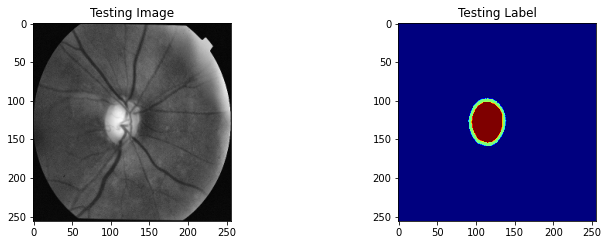

In [11]:
import random
test_img_number = random.randint(0, len(X_test)-1)
print(test_img_number)
test_img = X_test[test_img_number]
ground_truth=Y_test[test_img_number]
plt.figure(figsize=(12, 8))
plt.subplot(221)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(222)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0], cmap='jet')

# Model

In [12]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda
#from keras.optimizers import Adam
from tensorflow.keras.optimizers import Adam
from keras.layers import Activation, MaxPool2D, Concatenate


def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)   #Not in the original network. 
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)  #Not in the original network
    x = Activation("relu")(x)

    return x

#Encoder block: Conv block followed by maxpooling


def encoder_block(input, num_filters):
    x = conv_block(input, num_filters)
    p = MaxPool2D((2, 2))(x)
    return x, p   

#Decoder block
#skip features gets input from encoder for concatenation

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

#Build Unet using the blocks
def build_unet(input_shape, n_classes):
    inputs = Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    b1 = conv_block(p4, 1024) #Bridge

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    if n_classes == 1:  #Binary
      activation = 'sigmoid'
    else:
      activation = 'softmax'

    outputs = Conv2D(n_classes, 1, padding="same", activation=activation)(d4)  #Change the activation based on n_classes
    print(activation)

    model = Model(inputs, outputs, name="U-Net")
    return model

# Train

In [13]:
import os
import glob
import cv2
import numpy as np
from matplotlib import pyplot as plt


#Resizing images, if needed
#SIZE_X = 128 
#SIZE_Y = 128
n_classes=3 #Number of classes for segmentation

In [14]:
from tensorflow.keras.utils import to_categorical
train_masks_cat = to_categorical(Y_train, num_classes=n_classes)
y_train_cat = train_masks_cat.reshape((Y_train.shape[0], Y_train.shape[1], Y_train.shape[2], n_classes))

test_masks_cat = to_categorical(Y_test, num_classes=n_classes)
y_test_cat = test_masks_cat.reshape((Y_test.shape[0], Y_test.shape[1], Y_test.shape[2], n_classes))

In [15]:
print(train_masks_cat.shape)
print(train_masks_cat.dtype)
print(y_train_cat.shape)
print(y_train_cat.dtype)
print(Y_train.shape[2])

(80, 256, 256, 3)
float32
(80, 256, 256, 3)
float32
256


In [16]:

IMG_HEIGHT = X_train.shape[1]
IMG_WIDTH  = X_train.shape[2]
IMG_CHANNELS = X_train.shape[3]
input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS)

In [17]:
model = build_unet(input_shape, n_classes=3)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

softmax
Model: "U-Net"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 1) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 64) 640         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 256, 256, 64) 256         conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 256, 256, 64) 0           batch_normalization[0][0]        
______________________________________________________________________________________

In [18]:
history = model.fit(X_train, y_train_cat, 
                    batch_size = 2, 
                    verbose=1, 
                    epochs= 100, 
                    validation_data=(X_test, y_test_cat), 
                    shuffle=False)  

Epoch 1/100
40/40 [==============================] - 22s 95ms/step - loss: 0.2426 - accuracy: 0.9543 - val_loss: 12247.7402 - val_accuracy: 0.0256
Epoch 2/100
40/40 [==============================] - 3s 87ms/step - loss: 0.0803 - accuracy: 0.9822 - val_loss: 58.9912 - val_accuracy: 0.0662
Epoch 3/100
40/40 [==============================] - 3s 86ms/step - loss: 0.0551 - accuracy: 0.9841 - val_loss: 0.6597 - val_accuracy: 0.6666
Epoch 4/100
40/40 [==============================] - 3s 84ms/step - loss: 0.0463 - accuracy: 0.9846 - val_loss: 0.1783 - val_accuracy: 0.9634
Epoch 5/100
40/40 [==============================] - 3s 84ms/step - loss: 0.0392 - accuracy: 0.9864 - val_loss: 0.2068 - val_accuracy: 0.9628
Epoch 6/100
40/40 [==============================] - 3s 83ms/step - loss: 0.0337 - accuracy: 0.9875 - val_loss: 0.2087 - val_accuracy: 0.9628
Epoch 7/100
40/40 [==============================] - 3s 87ms/step - loss: 0.0308 - accuracy: 0.9882 - val_loss: 0.1992 - val_accuracy: 0.9628


In [19]:
model.save('model.hdf5')

# Eval

In [20]:
for key in history.history.keys():
    print(key)

loss
accuracy
val_loss
val_accuracy


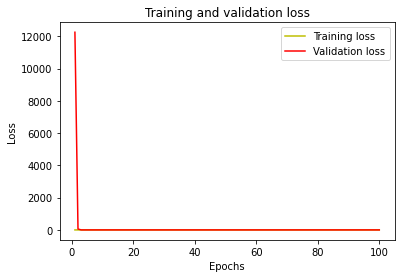

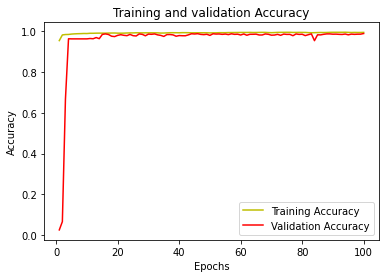

In [21]:

###
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

plt.plot(epochs, acc, 'y', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Training and validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [22]:
#Load previously saved model
from keras.models import load_model
model = load_model("/content/model.hdf5", compile=False)


In [23]:
y_pred=model.predict(X_test)

In [24]:
y_pred.shape

(16, 256, 256, 3)

In [25]:
y_pred_argmax=np.argmax(y_pred, axis=3)
y_pred_argmax.shape

(16, 256, 256)

In [26]:

#Using built in keras function
from keras.metrics import MeanIoU
n_classes = 3
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(Y_test[:,:,:,0], y_pred_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

Mean IoU = 0.74239236


In [27]:

#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[1,0] + values[2,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[0,1] + values[2,1])
class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[0,2] + values[1,2])
#class4_IoU = values[3,3]/(values[3,3] + values[3,0] + values[3,1] + values[3,2] + values[0,3]+ values[1,3]+ values[2,3])

print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)
print("IoU for class3 is: ", class3_IoU)
#print("IoU for class4 is: ", class4_IoU)

[[1.005407e+06 3.663000e+03 5.420000e+02]
 [2.306000e+03 7.862000e+03 1.993000e+03]
 [3.400000e+01 2.897000e+03 2.387200e+04]]
IoU for class1 is:  0.9935323
IoU for class2 is:  0.4199562
IoU for class3 is:  0.81368876


7
(16, 256, 256, 1)


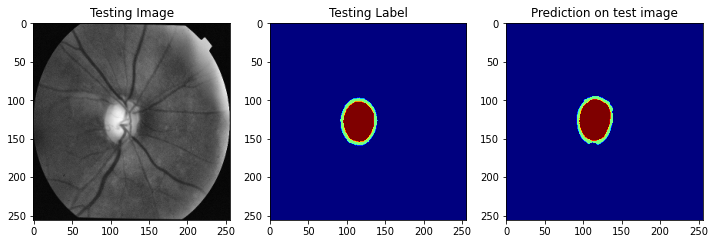

In [28]:
#Predict on a few images
#model = get_model()
#model.load_weights('???.hdf5')  
import random
test_img_number = random.randint(0, len(X_test)-1)
print(test_img_number)
print(X_test.shape)
test_img = X_test[test_img_number]
ground_truth=Y_test[test_img_number]
test_img_norm=test_img[:,:,0][:,:,None]
test_img_input=np.expand_dims(test_img_norm, 0)
prediction = (model.predict(test_img_input))
predicted_img=np.argmax(prediction, axis=3)[0,:,:]


plt.figure(figsize=(12, 8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,0], cmap='gray')
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(ground_truth[:,:,0], cmap='jet')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(predicted_img, cmap='jet')
plt.show()

0
(16, 256, 256, 1)


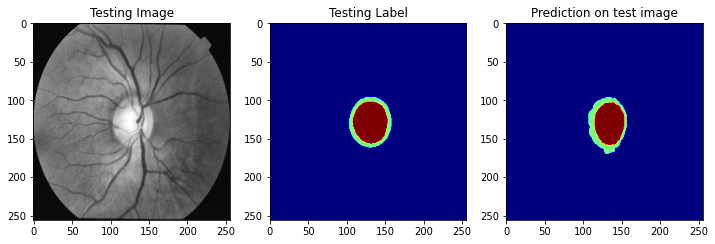

1
(16, 256, 256, 1)


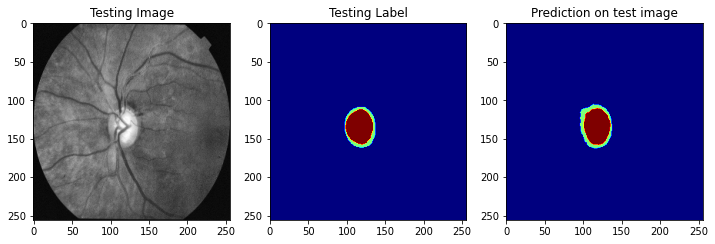

2
(16, 256, 256, 1)


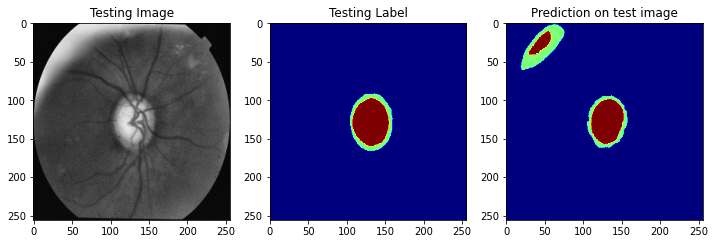

3
(16, 256, 256, 1)


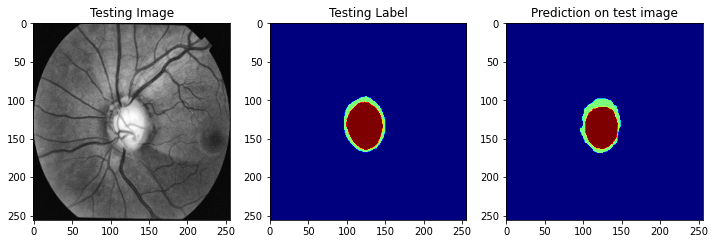

4
(16, 256, 256, 1)


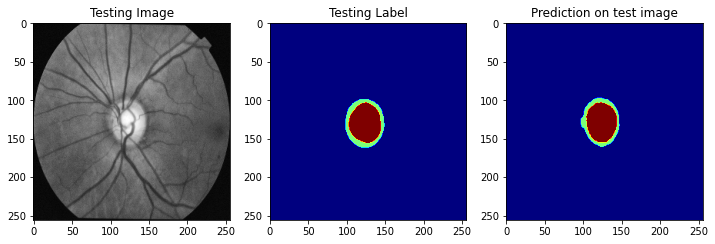

5
(16, 256, 256, 1)


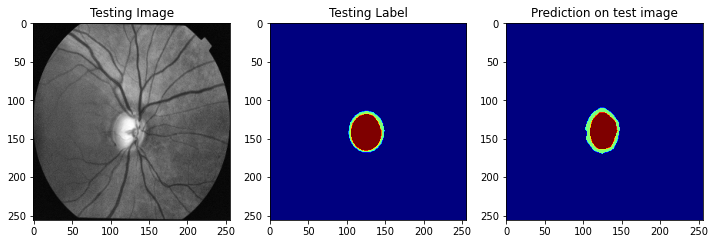

6
(16, 256, 256, 1)


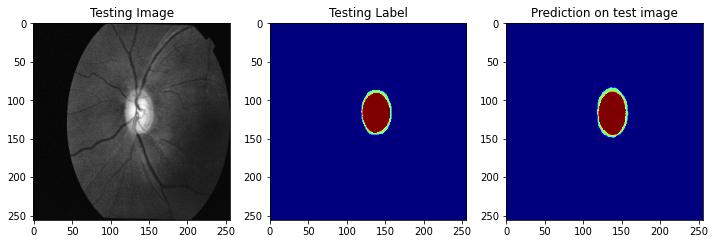

7
(16, 256, 256, 1)


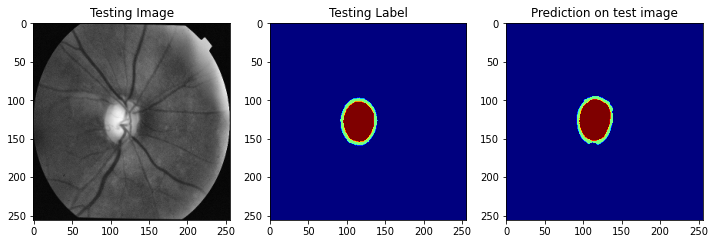

8
(16, 256, 256, 1)


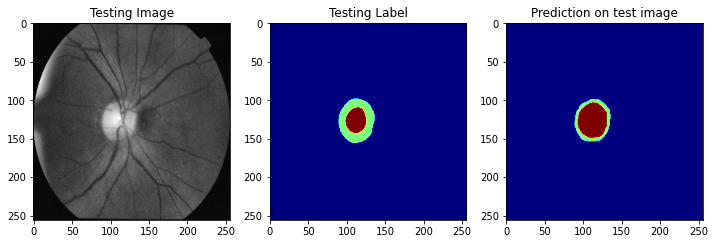

9
(16, 256, 256, 1)


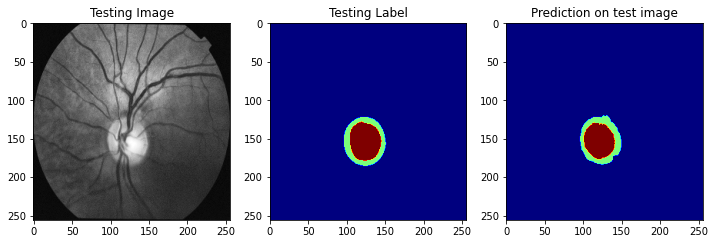

10
(16, 256, 256, 1)


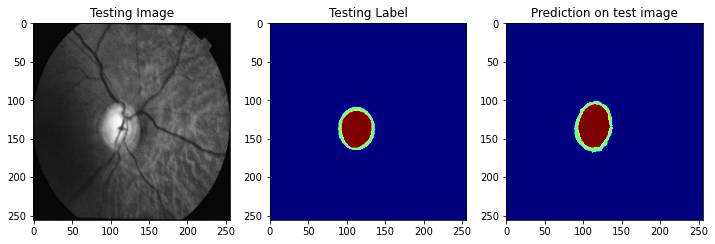

11
(16, 256, 256, 1)


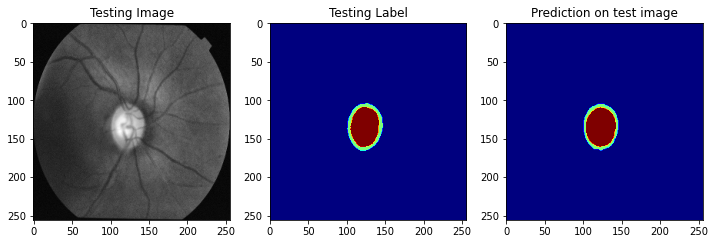

12
(16, 256, 256, 1)


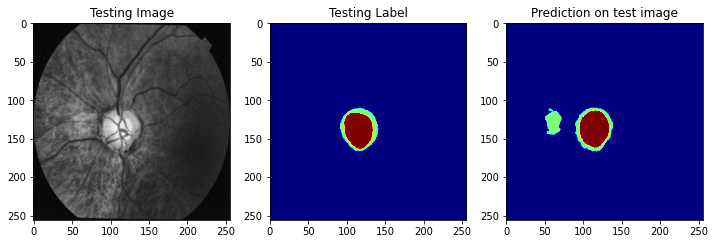

13
(16, 256, 256, 1)


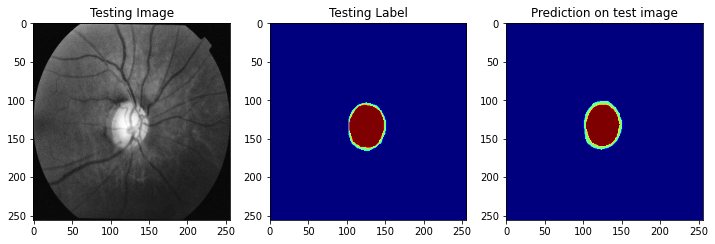

14
(16, 256, 256, 1)


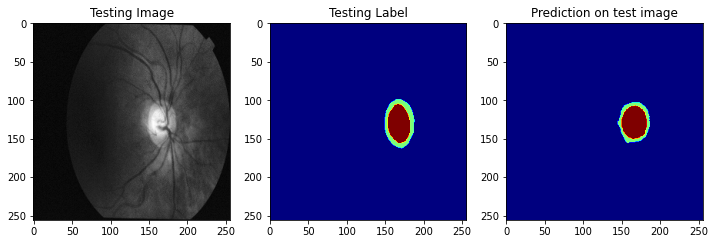

In [29]:
#Predict on a few images
#model = get_model()
#model.load_weights('???.hdf5')  

for x in range((len(X_test)-1)):
  test_img_number = x
  print(test_img_number)
  print(X_test.shape)
  test_img = X_test[test_img_number]
  ground_truth=Y_test[test_img_number]
  test_img_norm=test_img[:,:,0][:,:,None]
  test_img_input=np.expand_dims(test_img_norm, 0)
  prediction = (model.predict(test_img_input))
  predicted_img=np.argmax(prediction, axis=3)[0,:,:]

  plt.figure(figsize=(12, 8))
  plt.subplot(231)
  plt.title('Testing Image')
  plt.imshow(test_img[:,:,0], cmap='gray')
  plt.subplot(232)
  plt.title('Testing Label')
  plt.imshow(ground_truth[:,:,0], cmap='jet')
  plt.subplot(233)
  plt.title('Prediction on test image')
  plt.imshow(predicted_img, cmap='jet')
  plt.show()

# Metrics 

0
(256, 256, 1)
(256, 256)


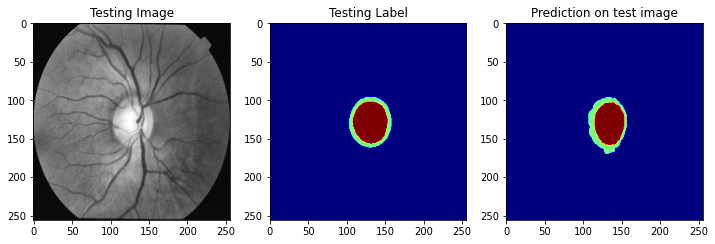

(256, 256)


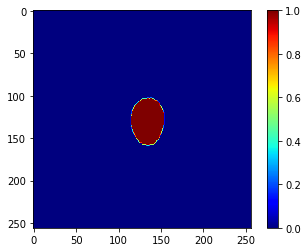

(256, 256, 3)


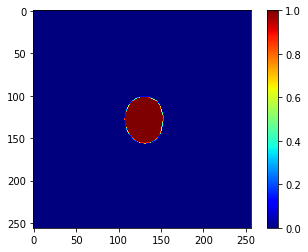

(65536,)
(65536,)
1
(256, 256, 1)
(256, 256)


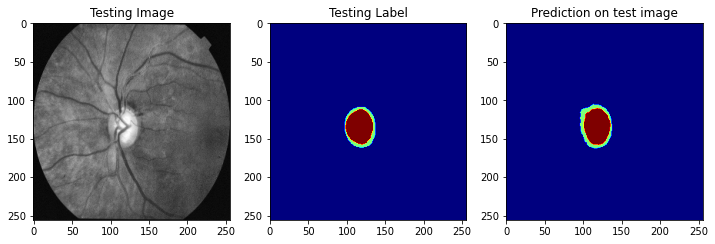

(256, 256)


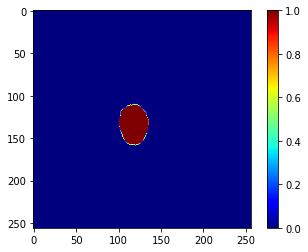

(256, 256, 3)


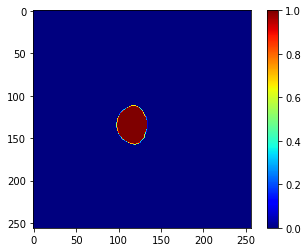

(65536,)
(65536,)
2
(256, 256, 1)
(256, 256)


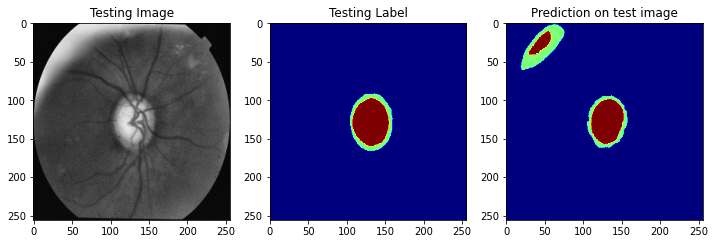

(256, 256)


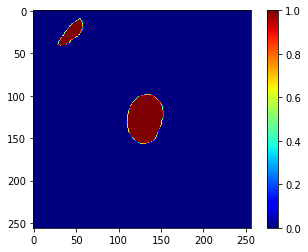

(256, 256, 3)


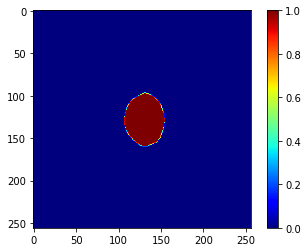

(65536,)
(65536,)
3
(256, 256, 1)
(256, 256)


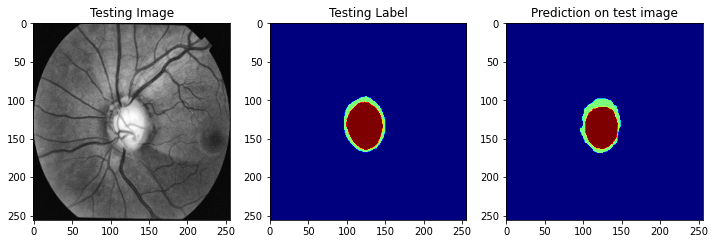

(256, 256)


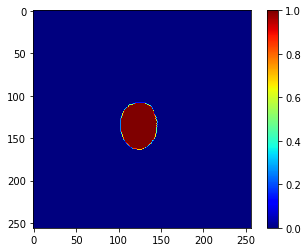

(256, 256, 3)


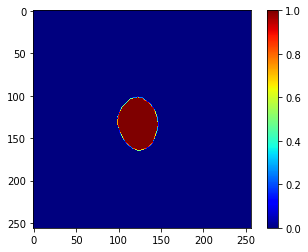

(65536,)
(65536,)
4
(256, 256, 1)
(256, 256)


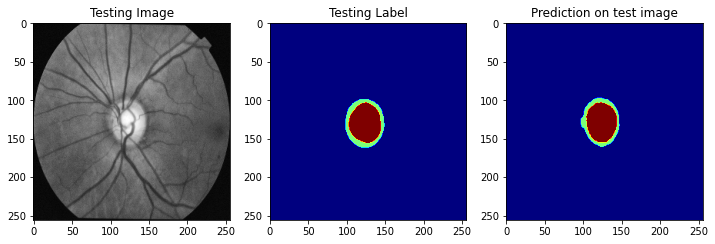

(256, 256)


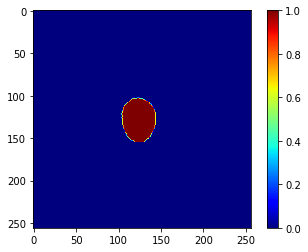

(256, 256, 3)


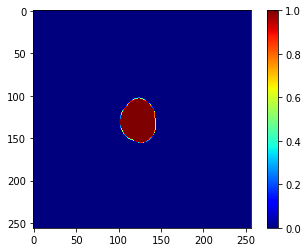

(65536,)
(65536,)
5
(256, 256, 1)
(256, 256)


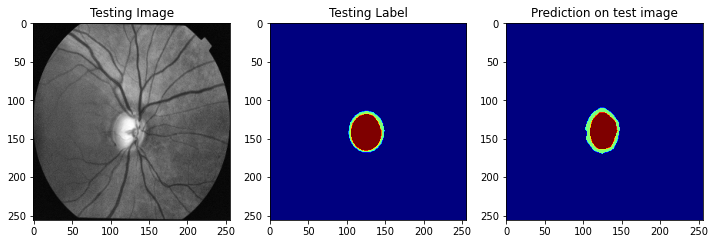

(256, 256)


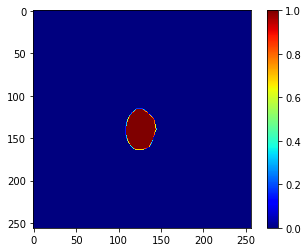

(256, 256, 3)


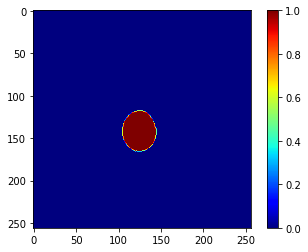

(65536,)
(65536,)
6
(256, 256, 1)
(256, 256)


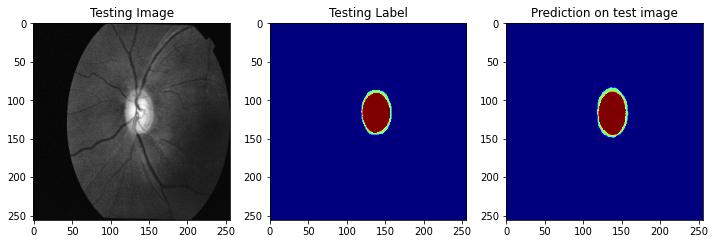

(256, 256)


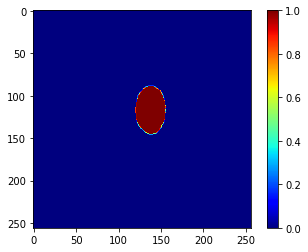

(256, 256, 3)


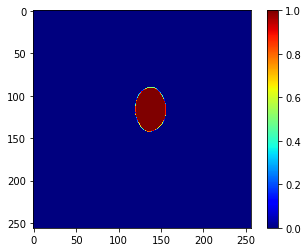

(65536,)
(65536,)
7
(256, 256, 1)
(256, 256)


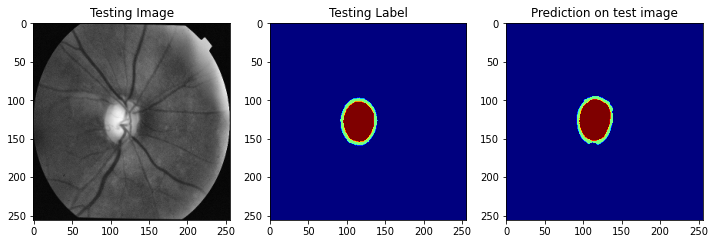

(256, 256)


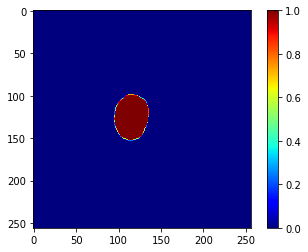

(256, 256, 3)


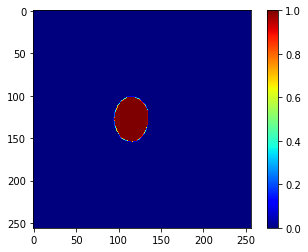

(65536,)
(65536,)
8
(256, 256, 1)
(256, 256)


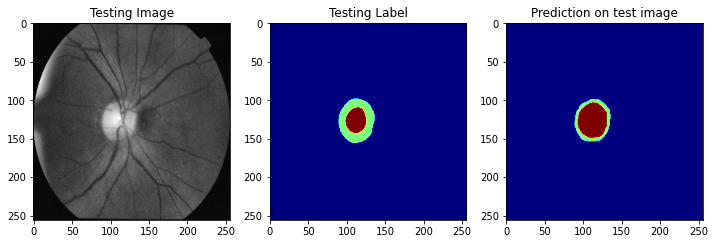

(256, 256)


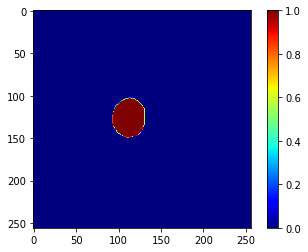

(256, 256, 3)


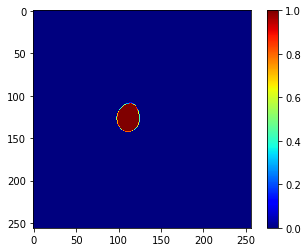

(65536,)
(65536,)
9
(256, 256, 1)
(256, 256)


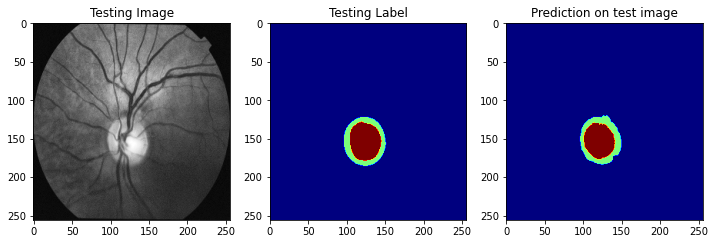

(256, 256)


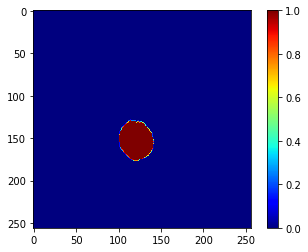

(256, 256, 3)


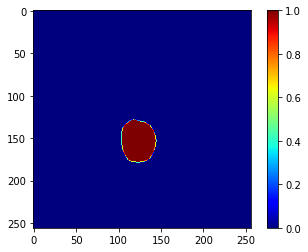

(65536,)
(65536,)
10
(256, 256, 1)
(256, 256)


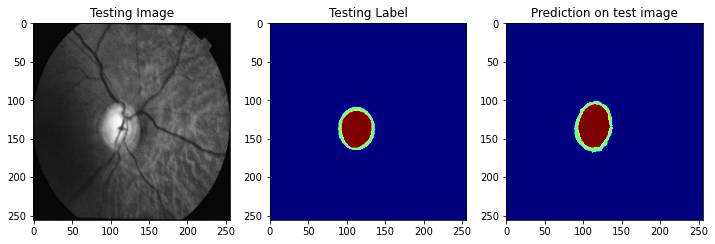

(256, 256)


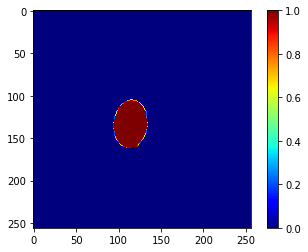

(256, 256, 3)


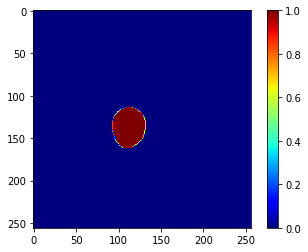

(65536,)
(65536,)
11
(256, 256, 1)
(256, 256)


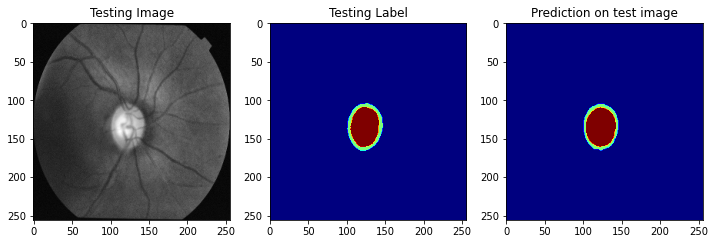

(256, 256)


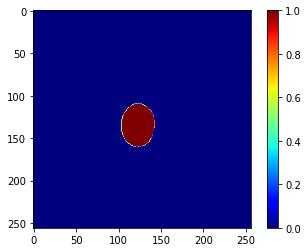

(256, 256, 3)


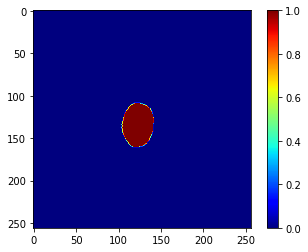

(65536,)
(65536,)
12
(256, 256, 1)
(256, 256)


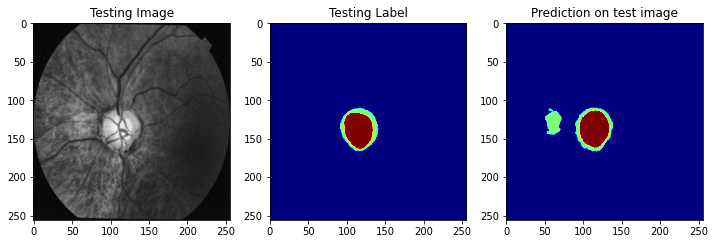

(256, 256)


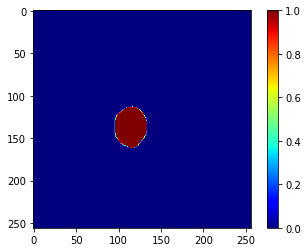

(256, 256, 3)


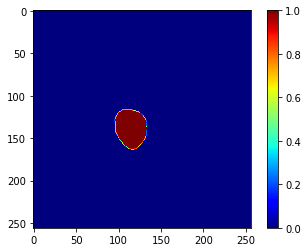

(65536,)
(65536,)
13
(256, 256, 1)
(256, 256)


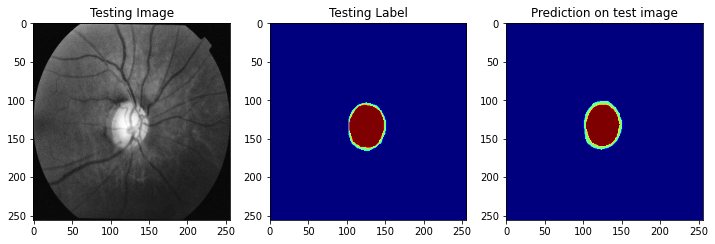

(256, 256)


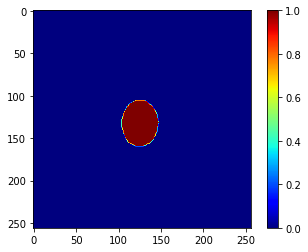

(256, 256, 3)


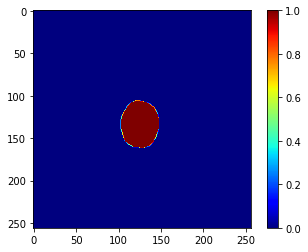

(65536,)
(65536,)
14
(256, 256, 1)
(256, 256)


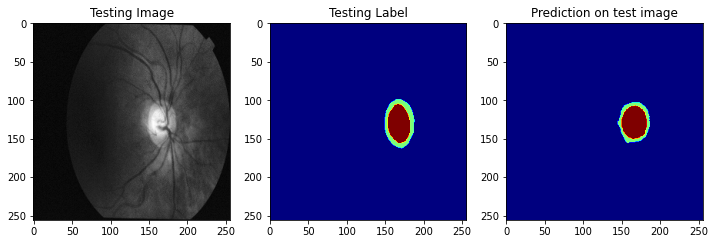

(256, 256)


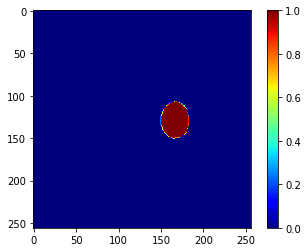

(256, 256, 3)


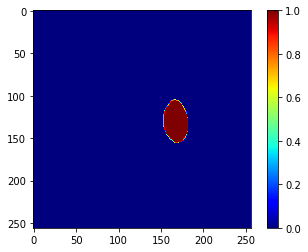

(65536,)
(65536,)
Accuracy for Cup: 0.99513
F1 for Cup: 0.89728
Jaccard for Cup: 0.82051
Recall for Cup: 0.91459
Precision: 0.89498


In [30]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
import numpy as np
import pandas as pd
import cv2
from glob import glob
from tqdm import tqdm
import tensorflow as tf
from tensorflow.keras.utils import CustomObjectScope
from sklearn.metrics import accuracy_score, f1_score, jaccard_score, precision_score, recall_score

def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)

if __name__ == "__main__":
    """ Save the results in this folder """
    create_dir("results")
    create_dir("results/Segmented Cup")

    def save_results(y_pred, save_image_path):

        y_pred = np.expand_dims(y_pred, axis=-1)
        y_pred = np.concatenate([y_pred, y_pred, y_pred], axis=-1) * 255
        print(y_pred.shape)
        cv2.imwrite(save_image_path, y_pred)

    SCORE_CUP = []

   
    for x in range((len(X_test)-1)):
        test_img_number = x
        print(test_img_number)
        test_img = X_test[test_img_number]
        ground_truth=Y_test[test_img_number]
        print(ground_truth.shape)
        ori_y = ground_truth[:,:,0]
        print(ori_y.shape)
        test_img_norm=test_img[:,:,0][:,:,None]
        test_img_input=np.expand_dims(test_img_norm, 0)
        prediction = (model.predict(test_img_input))
        predicted_img=np.argmax(prediction, axis=3)[0,:,:]

        plt.figure(figsize=(12, 8))
        plt.subplot(231)
        plt.title('Testing Image')
        plt.imshow(test_img[:,:,0], cmap='gray')
        plt.subplot(232)
        plt.title('Testing Label')
        plt.imshow(ground_truth[:,:,0], cmap='jet')
        plt.subplot(233)
        plt.title('Prediction on test image')
        plt.imshow(predicted_img, cmap='jet')
        plt.show()

        print(predicted_img.shape)
        predicted_img[predicted_img==1]=0
        predicted_img[predicted_img==2]=1
        plt.imshow(predicted_img, cmap='jet')
        plt.colorbar()
        plt.show()

        save_image_path = f"results/Segmented Cup/{x}.png"
        save_results(predicted_img, save_image_path)


        ori_y[ori_y==1]=0
        ori_y[ori_y==2]=1
        plt.imshow(ori_y, cmap='jet')
        plt.colorbar()
        plt.show()


        k= ori_y.flatten()
        print(k.shape)
        predicted_img = predicted_img.flatten()
        print(predicted_img.shape)

        acc_value = accuracy_score(k, predicted_img)
        f1_value = f1_score(k, predicted_img, labels=[0, 1], average="binary")
        jac_value = jaccard_score(k, predicted_img, labels=[0, 1], average="binary")
        recall_value = recall_score(k, predicted_img, labels=[0, 1], average="binary")
        precision_value = precision_score(k, predicted_img, labels=[0, 1], average="binary")
        SCORE_CUP.append([acc_value, f1_value, jac_value, recall_value, precision_value])

    score = [s[0:] for s in SCORE_CUP]
    score = np.mean(score, axis=0)
    print(f"Accuracy for Cup: {score[0]:0.5f}")
    print(f"F1 for Cup: {score[1]:0.5f}")
    print(f"Jaccard for Cup: {score[2]:0.5f}")
    print(f"Recall for Cup: {score[3]:0.5f}")
    print(f"Precision: {score[4]:0.5f}")

    """ Saving """
    df = pd.DataFrame(SCORE_CUP, columns=[ "Acc", "F1", "Jaccard", "Recall", "Precision"])
    df.to_csv("results/score_cup.csv")


In [31]:
!zip -r /content/results.zip /content/results

  adding: content/results/ (stored 0%)
  adding: content/results/Segmented Cup/ (stored 0%)
  adding: content/results/Segmented Cup/8.png (deflated 54%)
  adding: content/results/Segmented Cup/13.png (deflated 50%)
  adding: content/results/Segmented Cup/9.png (deflated 48%)
  adding: content/results/Segmented Cup/7.png (deflated 47%)
  adding: content/results/Segmented Cup/6.png (deflated 46%)
  adding: content/results/Segmented Cup/14.png (deflated 52%)
  adding: content/results/Segmented Cup/11.png (deflated 46%)
  adding: content/results/Segmented Cup/2.png (deflated 42%)
  adding: content/results/Segmented Cup/5.png (deflated 56%)
  adding: content/results/Segmented Cup/10.png (deflated 48%)
  adding: content/results/Segmented Cup/12.png (deflated 58%)
  adding: content/results/Segmented Cup/3.png (deflated 52%)
  adding: content/results/Segmented Cup/1.png (deflated 47%)
  adding: content/results/Segmented Cup/0.png (deflated 48%)
  adding: content/results/Segmented Cup/4.png (de

In [32]:
from google.colab import files
files.download("/content/results.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# CDR calculation

In [ ]:
from scipy import signal
import cv2
import sys
import glob
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
import os
from PIL import Image
import xlrd 
import math
from pylab import*
from scipy import signal
import numpy as np
from matplotlib import pyplot as plt
from skimage.feature import greycomatrix, greycoprops
from skimage import data

In [ ]:
# FUNCTION TO CALCULATE CDR

#import cv2 as cv

def cdr(cup,disc,plot):
    
    #morphological closing and opening operations
    R1 = cv2.morphologyEx(cup, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(2,2)), iterations = 1)
    r1 = cv2.morphologyEx(R1, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(7,7)), iterations = 1)
    R2 = cv2.morphologyEx(r1, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(1,21)), iterations = 1)
    r2 = cv2.morphologyEx(R2, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(21,1)), iterations = 1)
    R3 = cv2.morphologyEx(r2, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(33,33)), iterations = 1)	
    r3 = cv2.morphologyEx(R3, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(43,43)), iterations = 1)

    img = clahe.apply(r3)
    
    
    ret,thresh = cv2.threshold(cup,127,255,0)
    img,contours,hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE) #Getting all possible contours in the segmented image
    cup_diameter = 0
    largest_area = 0
    el_cup = contours[0]
    if len(contours) != 0:
        for i in range(len(contours)):
            if len(contours[i]) >= 5:
                area = cv2.contourArea(contours[i]) #Getting the contour with the largest area
                if (area>largest_area):
                    largest_area=area
                    index = i
                    el_cup = cv2.fitEllipse(contours[i])
                
    cv2.ellipse(img,el_cup,(140,60,150),3)  #fitting ellipse with the largest area
    x,y,w,h = cv2.boundingRect(contours[index]) #fitting a rectangle on the ellipse to get the length of major axis
    cup_diameter = max(w,h) #major axis is the diameter

    #morphological closing and opening operations
    R1 = cv2.morphologyEx(disc, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(2,2)), iterations = 1)
    r1 = cv2.morphologyEx(R1, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(7,7)), iterations = 1)
    R2 = cv2.morphologyEx(r1, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(1,21)), iterations = 1)
    r2 = cv2.morphologyEx(R2, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(21,1)), iterations = 1)
    R3 = cv2.morphologyEx(r2, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(33,33)), iterations = 1)
    r3 = cv2.morphologyEx(R3, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(43,43)), iterations = 1)

    img2 = clahe.apply(r3)
    
    ret,thresh = cv2.threshold(disc,127,255,0)
    img2,contours,hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE) #Getting all possible contours in the segmented image
    disk_diameter = 0
    largest_area = 0
    el_disc = el_cup
    if len(contours) != 0:
          for i in range(len(contours)):
            if len(contours[i]) >= 5:
                area = cv2.contourArea(contours[i]) #Getting the contour with the largest area
                if (area>largest_area):
                    largest_area=area
                    index = i
                    el_disc = cv2.fitEllipse(contours[i])
                    
    cv2.ellipse(img2,el_disc,(140,60,150),3) #fitting ellipse with the largest area
    x,y,w,h = cv2.boundingRect(contours[index]) #fitting a rectangle on the ellipse to get the length of major axis
    disk_diameter = max(w,h) #major axis is the diameter
                
    if plot:
        plt.imshow(img2, cmap = 'gray', interpolation = 'bicubic')
        plt.axis("off")
        plt.title("Optic Disk")
        plt.show()
        plt.imshow(img)
        plt.axis("off")
        plt.title("Optic Cup")
        plt.show()
        
    if(disk_diameter == 0): return 1 # if disc not segmented properly then cdr might be infinity
    cdr = cup_diameter/disk_diameter #ration of major axis of cup and disc
    return cdr

In [ ]:
# MAIN FUNCTION
CDR = [] # load calculated cdr here
VAL = [] # load their labels here
count = 0
for i in range(len(X_all)):
    set_path = os.path.join('E:/optic-cup-disc', 'Drishti-GS1_files','Drishti-GS1_files', 'Test',file_names[i]) #folder to the test image in dataset(don't change file_names[])
    image = cv2.imread(set_path,1)
    segment(image,False,False)
    cup = cv2.imread('E:/Term Project 01/cup.png',0) #images will be saved in the same folder as the code so that folder needs to be put here
    disc = cv2.imread('E:/Term Project 01/disk.png',0) #images will be saved in the same folder as the code so that folder needs to be put here
    cdr_cal = cdr(cup,disc,False)
    if(val[1][int(file_codes_all[count][1:])-1] == 'Glaucomatous'):
        VAL.append(1)
    else:
        VAL.append(0)
    CDR.append(cdr_cal)
    print(file_codes_all[count],'Exp1_cdr:',exp1[count],'Exp2_cdr:',exp2[count],'Exp3_cdr:',exp3[count],'Exp4_cdr:',exp4[count],'Pred_cdr:',cdr_cal)
    os.remove('E:/Term Project 01/cup.png') #put same folder as that of cup and disc so that they can be removed for processing of next set
    os.remove('E:/Term Project 01/disk.png')
    count+=1

error1,error2,error3,error4 = [],[],[],[]
#calculated error against each expert
for i in range(len(X_all)):
    error1.append(float(exp1[i]) - CDR[i])
    error2.append(float(exp2[i]) - CDR[i])
    error3.append(float(exp3[i]) - CDR[i])
    error4.append(float(exp4[i]) - CDR[i])

#saving the error and calculated cdr and its label into csv files for training classification model
a = pd.DataFrame(error1) #exper1
b = pd.DataFrame(error2) #exper2
c = pd.DataFrame(error3) #exper3
d = pd.DataFrame(error4) #exper4
x1 = pd.DataFrame(CDR) #calculated cdr
y1 = pd.DataFrame(VAL) #It's actual label
x1.to_csv('E:/Term Project 01/x1.csv',index=False)
y1.to_csv('E:/Term Project 01/y1.csv',index=False)
a.to_csv('E:/Term Project 01/a.csv',index=False)
b.to_csv('E:/Term Project 01/b.csv',index=False)
c.to_csv('E:/Term Project 01/c.csv',index=False)
d.to_csv('E:/Term Project 01/d.csv',index=False)

# Classification Model